## Lane B from 4/2022
8/12/2023 - Data generated from Lentimix Library run 1 from 4/2022
Run on 6 lanes, using Library2, Library3 barcode enrichment
Analyze global run on cellranger v6 data and create h5_ad files for further analysis

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import math
import matplotlib

import anndata
from pathlib import Path

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/3482209352.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.1.3 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


In [4]:
library = ["1660-Fosl2.752","1661-Fhl2.467","1663-Myc.989","1665-Yap1.735","1667-Atf4.1383","1671-Nfkb2.152",
           "1673-Relb.286","1676-Onecut2.2361","1811-Itga2.672","1999-Cldn4-951","2114-Lif.1890",
           "2115-Fosl1.1401","2118-Nfkb1.3737",'shRenilla']

In [5]:
tags = ["shRenilla_TGTCTAGT", "shRenilla_CATAGTCA", "shPatch_GTACTTGC", "shPatch_CCATTACT", 
        "1660-Fosl2.752_CGGGAATG", "1661-Fhl2.467_GCCTACGT", "1663-Myc.989_CTGAATCT",  "1665-Yap1.735_CGTTAGGG",
        "1667-Atf4.1383_TCTGGGGC", "1671-Nfkb2.152_CGTTCAAG", "1673-Relb.286_ACAGAGCC", 
        "1676-Onecut2.2361_TTAATTAG", "1811-Itga2.672_GCCAATCG", "1999-Cldn4-951_CGTTTCCT", 
        "2114-Lif.1890_ACACGTGA", "2115-Fosl1.1401_GGTAGGGA", "2118-Nfkb1.3737_CAGTGCAT"]

In [6]:
targetGenes = ['Fosl2', 'Fhl2', 'Myc', 'Yap1', 'Atf4', 'Nfkb2', 'Relb', 'Onecut2', 'Itga2', 'Cldn4', 'Lif', 'Fosl1', 'Nfkb1', 'Slc4a11', 'Tigit']

In [7]:
results_file = 'write/allmice.h5ad'  # the file that will store the analysis results

Read in the count matrix into an [`AnnData`](https://anndata.readthedocs.io/en/latest/anndata.AnnData.html) object, which holds many slots for annotations and different representations of the data. It also comes with its own HDF5 file format: `.h5ad`.

In [8]:
adata = sc.read_10x_h5('Lib1_LaneB_filtered_feature_bc_matrix.h5', gex_only=False)

reading Lib1_LaneB_filtered_feature_bc_matrix.h5
 (0:00:01)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [10]:
samples = list(adata[:,adata.var['feature_types']=='Antibody Capture'].var.index)

In [11]:
print(samples)

['AM1815_B0301', 'AO1376_B0302', 'AO1721_B0303', 'AN1062_B0304', 'AM1063_B0305', 'AO1092_B0306']


In [12]:
# Now filter out barcodes
hashadata = adata[:,samples]
adata = adata[:,[y for y in adata.var_names if y not in samples]]

In [13]:
hashadata.var

,gene_ids,feature_types,genome
AM1815_B0301,AM1815,Antibody Capture,
AO1376_B0302,AO1376,Antibody Capture,
AO1721_B0303,AO1721,Antibody Capture,
AN1062_B0304,AN1062,Antibody Capture,
AM1063_B0305,AM1063,Antibody Capture,
AO1092_B0306,AO1092,Antibody Capture,


## Preprocessing

Show those genes that yield the highest fraction of counts in each single cell, across all cells.

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


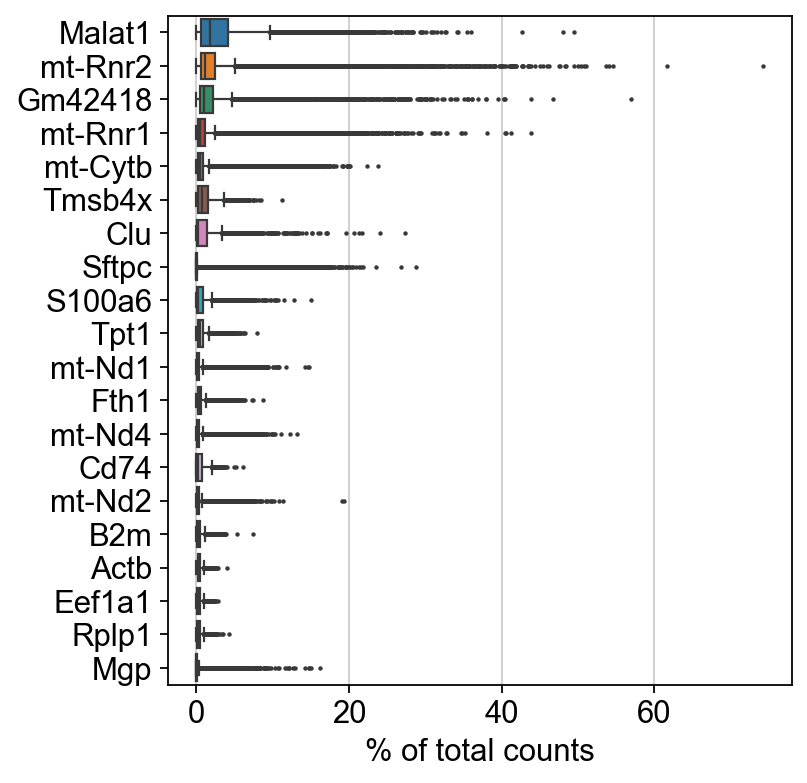

In [14]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Basic filtering:

In [15]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)
#sc.pp.filter_cells(adata, min_counts=1500)

filtered out 474 cells that have less than 300 genes expressed
filtered out 29526 genes that are detected in less than 3 cells


In [16]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') # annotate the group of mitochondrial genes as 'MT'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

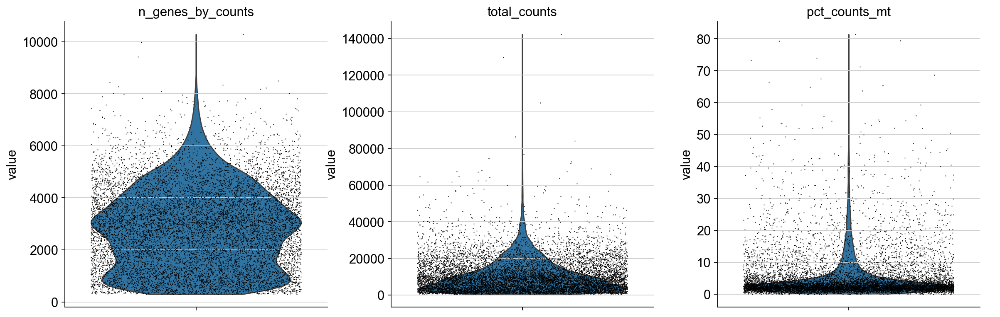

In [17]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

(array([3.000e+00, 1.800e+01, 7.900e+01, 1.490e+02, 3.740e+02, 1.374e+03,
        3.001e+03, 3.699e+03, 1.389e+03, 1.270e+02]),
 array([0.68732109, 0.71400824, 0.74069539, 0.76738254, 0.79406969,
        0.82075684, 0.84744399, 0.87413114, 0.9008183 , 0.92750545,
        0.9541926 ]),
 <BarContainer object of 10 artists>)

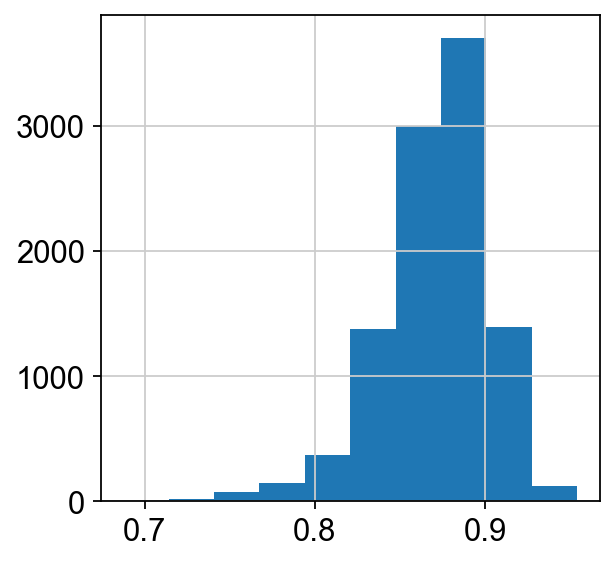

In [18]:
adata.obs["log10GenesPerUMI"] = adata.obs['n_genes_by_counts'].apply(math.log10) / adata.obs['total_counts'].apply(math.log10)
matplotlib.pyplot.hist(adata.obs["log10GenesPerUMI"])

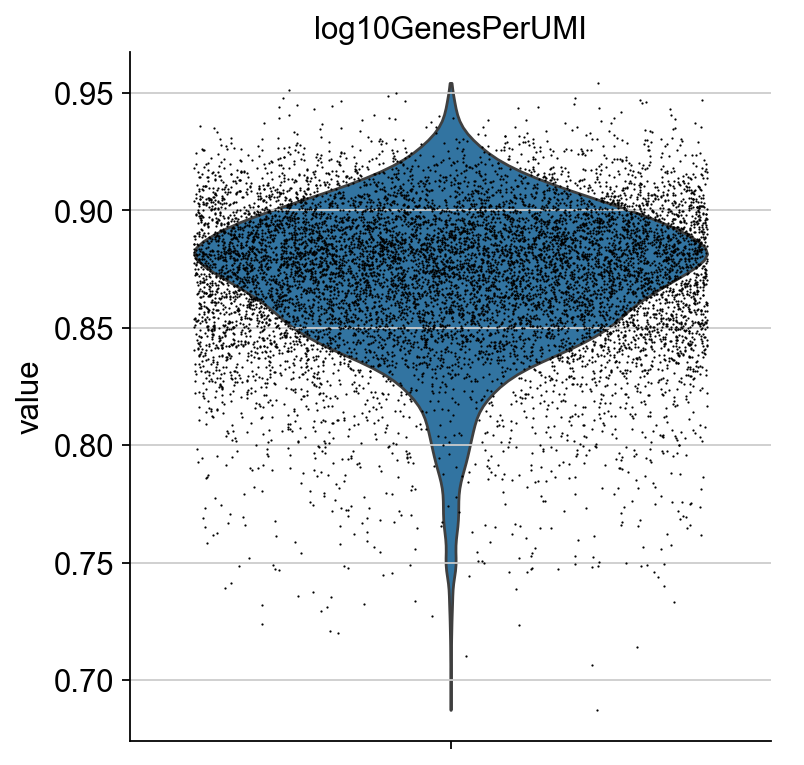

In [19]:
sc.pl.violin(adata, ['log10GenesPerUMI'],
             jitter=0.4, multi_panel=True, rotation=90)
#99% seems like a good Human pct count cutoff

Keep singlets, remove cells that have too many mouse reads, or mitochondrial genes expressed or too many total counts:

In [20]:
#Filter by Log10GenesPerUMI
adata = adata[adata.obs.log10GenesPerUMI >= 0.8,:]

In [21]:
#adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt <= 10, :]

## Run Demultiplexing

In [22]:
hashadata = hashadata[hashadata.obs.index.isin(adata.obs.index), :]

In [23]:
hashCounts = pd.DataFrame(hashadata.X.todense(), columns=hashadata.var_names, index=adata.obs.index)

In [24]:
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.99,0.999])
hashDisc

,AM1815_B0301,AO1376_B0302,AO1721_B0303,AN1062_B0304,AM1063_B0305,AO1092_B0306
count,8699.000000,8699.000000,8699.000000,8699.000000,8699.000000,8699.000000
mean,546.417969,809.668030,98.856537,272.975403,505.504547,1864.726562
std,1575.063599,2882.684082,785.977478,1526.944458,1188.657715,4688.752441
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10%,4.000000,6.000000,0.000000,1.000000,3.000000,11.000000
20%,5.000000,8.000000,1.000000,2.000000,5.000000,14.000000
30%,7.000000,9.000000,1.000000,2.000000,6.000000,18.000000
40%,9.000000,11.000000,1.000000,3.000000,8.000000,21.000000
50%,11.000000,13.000000,2.000000,4.000000,10.000000,25.000000
60%,16.000000,15.000000,2.000000,4.000000,14.000000,32.000000


In [25]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
hashIDs

AM1815_B0301
1853.0
AO1376_B0302
917.5999999999976
AO1721_B0303
7.0
AN1062_B0304
13.0
AM1063_B0305
2113.3999999999996
AO1092_B0306
8215.199999999997


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise 

,AM1815_B0301,AO1376_B0302,AO1721_B0303,AN1062_B0304,AM1063_B0305,AO1092_B0306
AAACCCAAGTCACGAG-1,True,True,False,True,True,False
AAACCCAAGTCTCCTC-1,False,False,False,False,False,False
AAACCCACAACCGATT-1,False,False,False,False,False,False
AAACCCACAATGAACA-1,False,False,False,False,False,False
AAACCCACATTCACAG-1,False,False,False,False,False,False
...,...,...,...,...,...,...
TTTGTTGCAGACGGAT-1,False,False,False,False,False,False
TTTGTTGCAGATACCT-1,False,True,False,False,False,False
TTTGTTGCATGCGGTC-1,False,False,False,False,False,True
TTTGTTGGTTTCGGCG-1,False,False,False,True,False,False


In [26]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [27]:
from matplotlib import pyplot as plt

In [28]:
plt.rcParams['figure.figsize'] = (4,4)

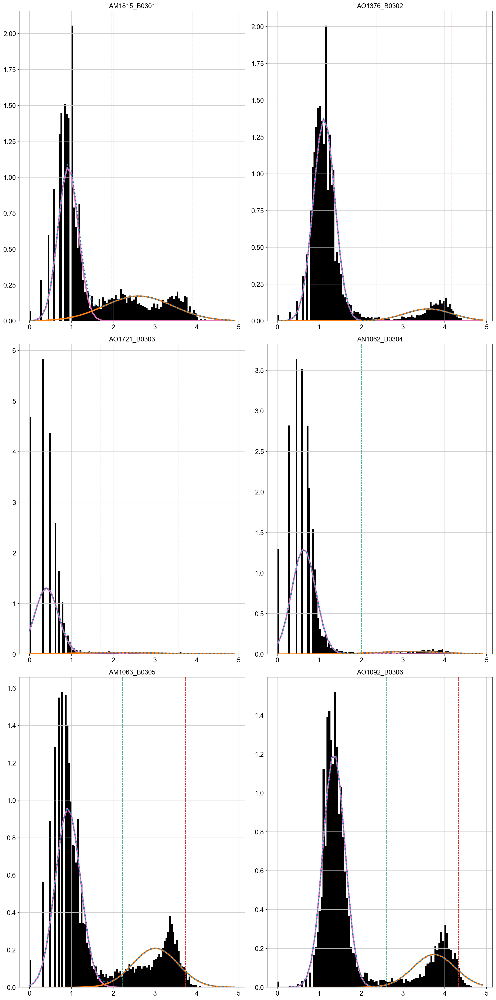

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

fig, axs = plt.subplots(3,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(hashadata.var_names)),hashadata.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(hashadata.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
        else:
            #hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1 and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [30]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
AM1815_B0301,1.950
AO1376_B0302,2.380
AO1721_B0303,1.705
AN1062_B0304,2.015
AM1063_B0305,2.225
AO1092_B0306,2.605


In [31]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

AM1815_B0301
1.95
AO1376_B0302
2.38
AO1721_B0303
1.705
AN1062_B0304
2.015
AM1063_B0305
2.225
AO1092_B0306
2.605


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True  True False ... False False  True]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/1750252066.py:6: FutureWarning: Setting an item of incomp

,AM1815_B0301,AO1376_B0302,AO1721_B0303,AN1062_B0304,AM1063_B0305,AO1092_B0306
AAACCCAAGTCACGAG-1,True,True,False,False,True,True
AAACCCAAGTCTCCTC-1,True,False,False,False,False,False
AAACCCACAACCGATT-1,False,False,False,False,False,False
AAACCCACAATGAACA-1,True,False,False,False,False,False
AAACCCACATTCACAG-1,False,False,False,False,True,False
...,...,...,...,...,...,...
TTTGTTGCAGACGGAT-1,True,False,False,False,False,False
TTTGTTGCAGATACCT-1,False,True,False,False,False,False
TTTGTTGCATGCGGTC-1,False,False,False,False,False,True
TTTGTTGGTTTCGGCG-1,False,False,False,False,False,False


In [32]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [33]:
adata.obs["Classification"] = classification
hashadata.obs["Classification"] = classification
adata.obs["Classification"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/4135005838.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Classification"] = classification
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/4135005838.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  hashadata.obs["Classification"] = classification


Classification
AM1815_B0301    1985
AM1063_B0305    1806
AO1092_B0306    1430
negative        1414
AO1376_B0302     719
doublet          664
AN1062_B0304     345
AO1721_B0303     336
Name: count, dtype: int64

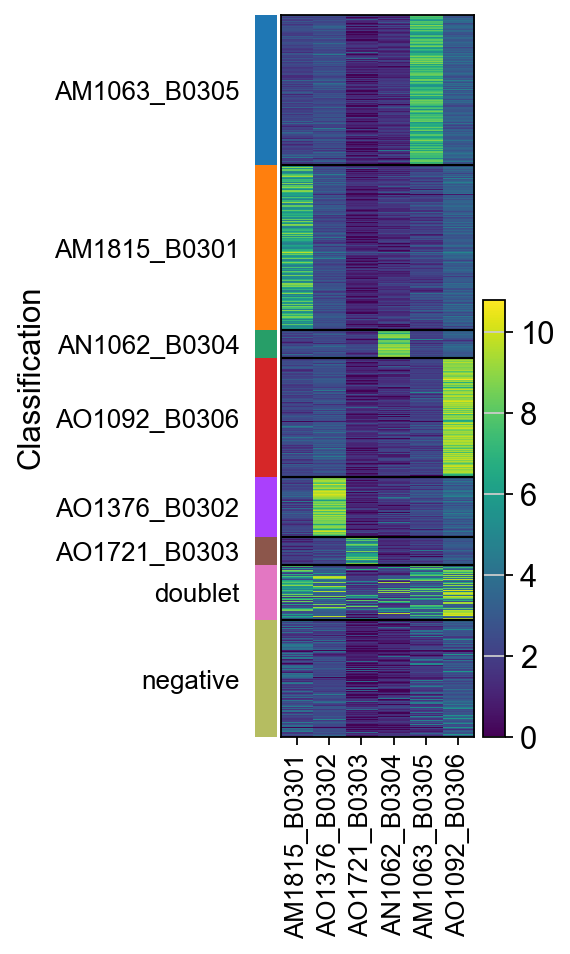

In [34]:
#output visulaization of hashing
sc.pl.heatmap(hashadata, hashadata.var_names, groupby="Classification", log=True)#, save = f"_{figName}_hash.png")

In [35]:
hashCounts = pd.DataFrame(index=adata.obs.index)

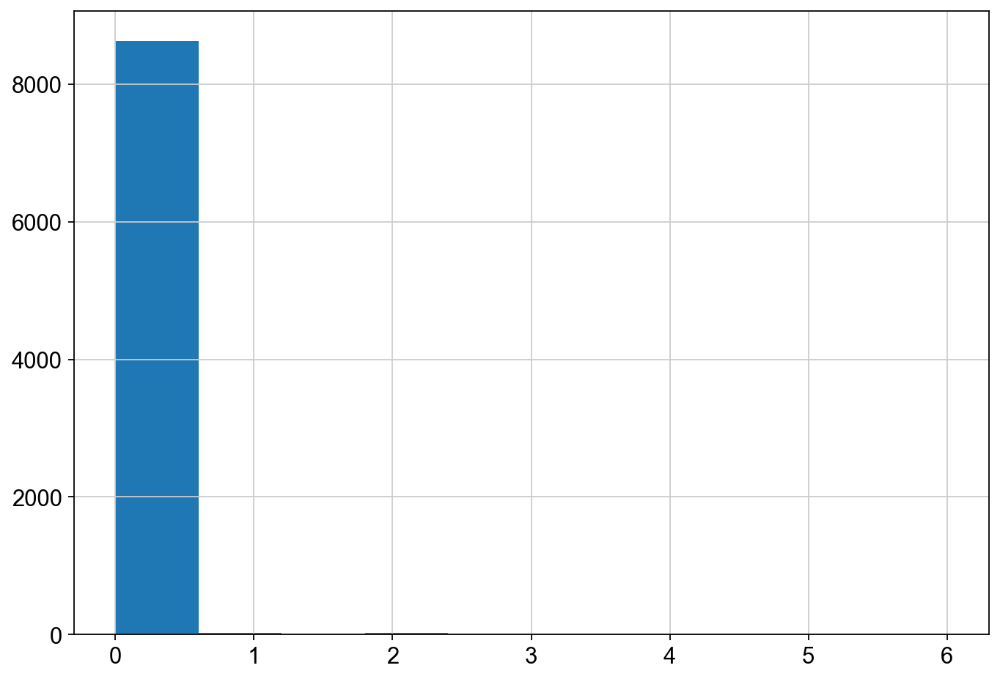

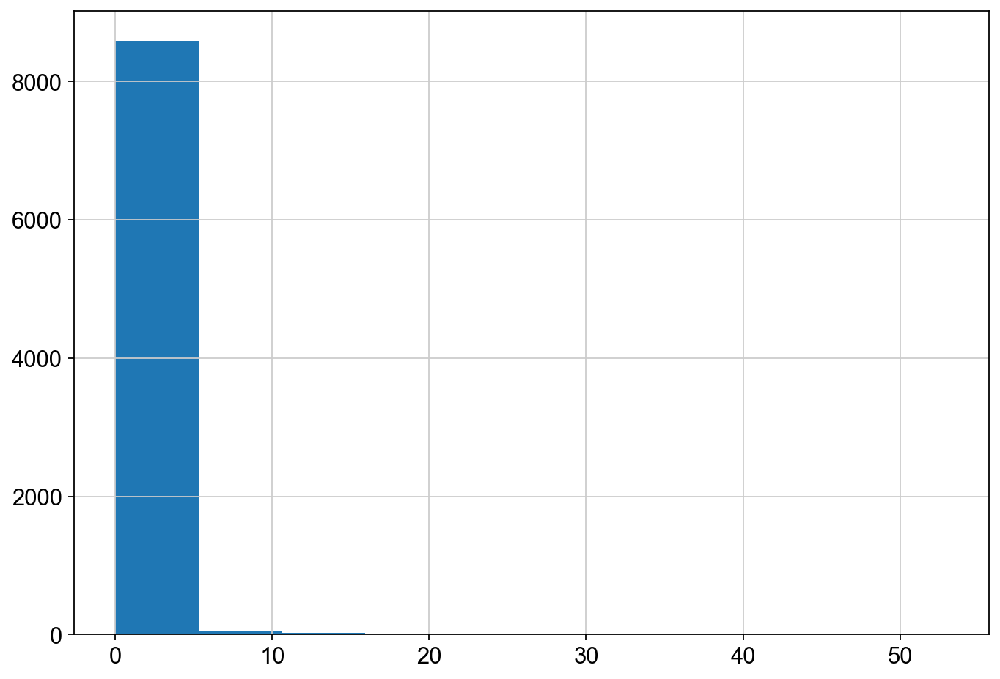

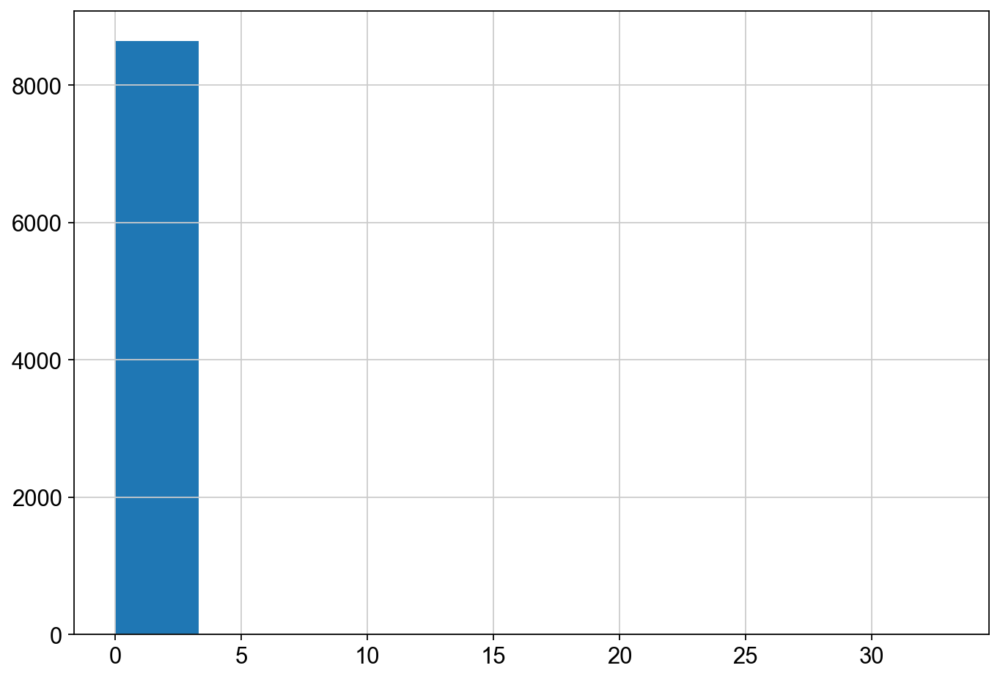

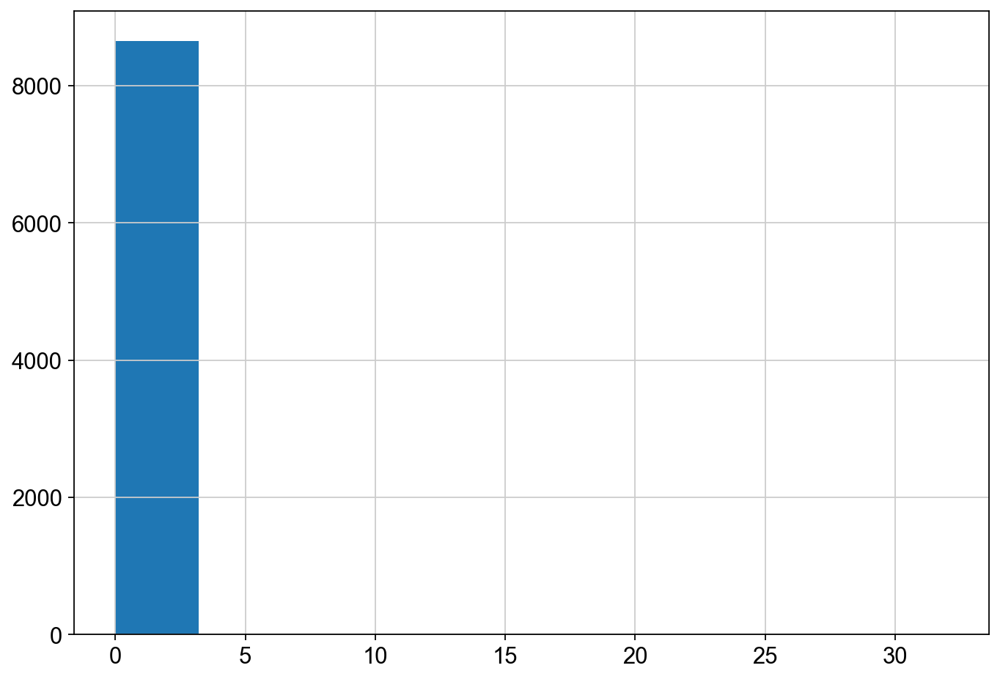

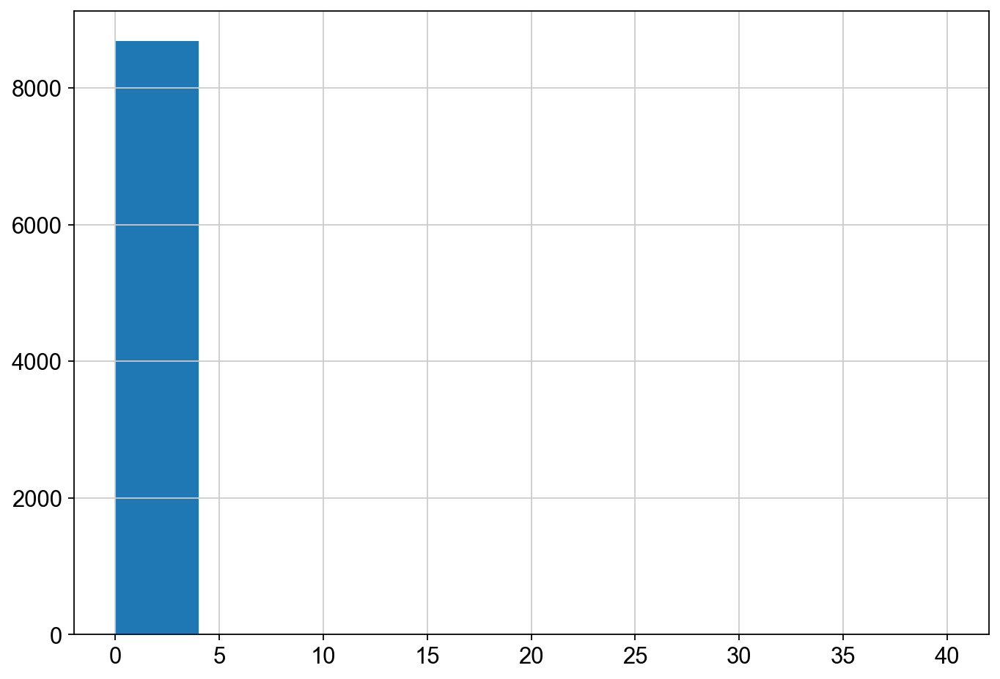

...

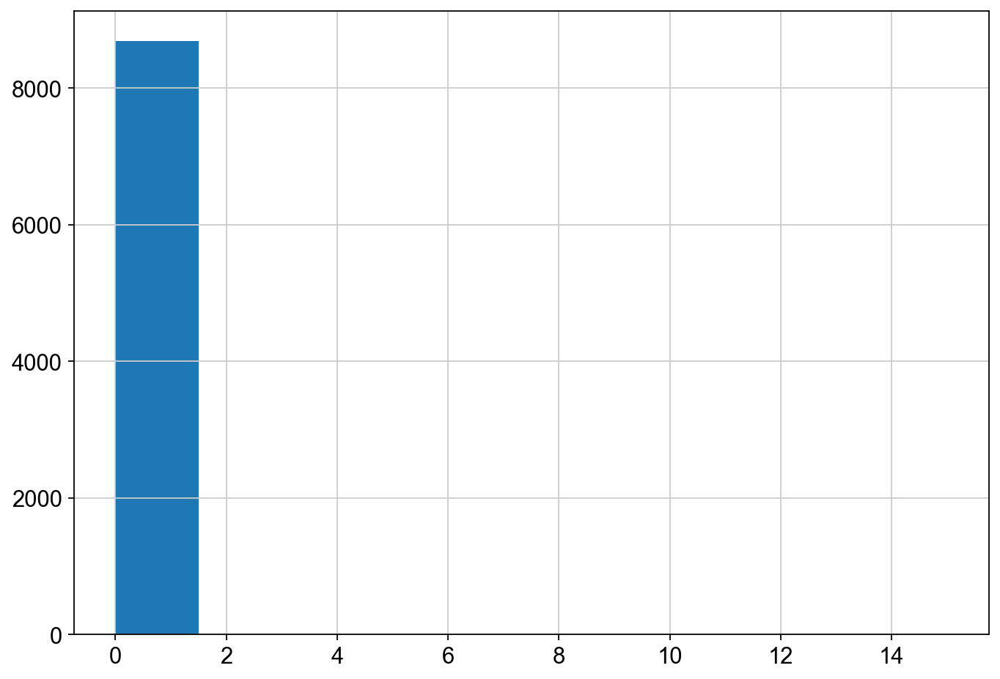

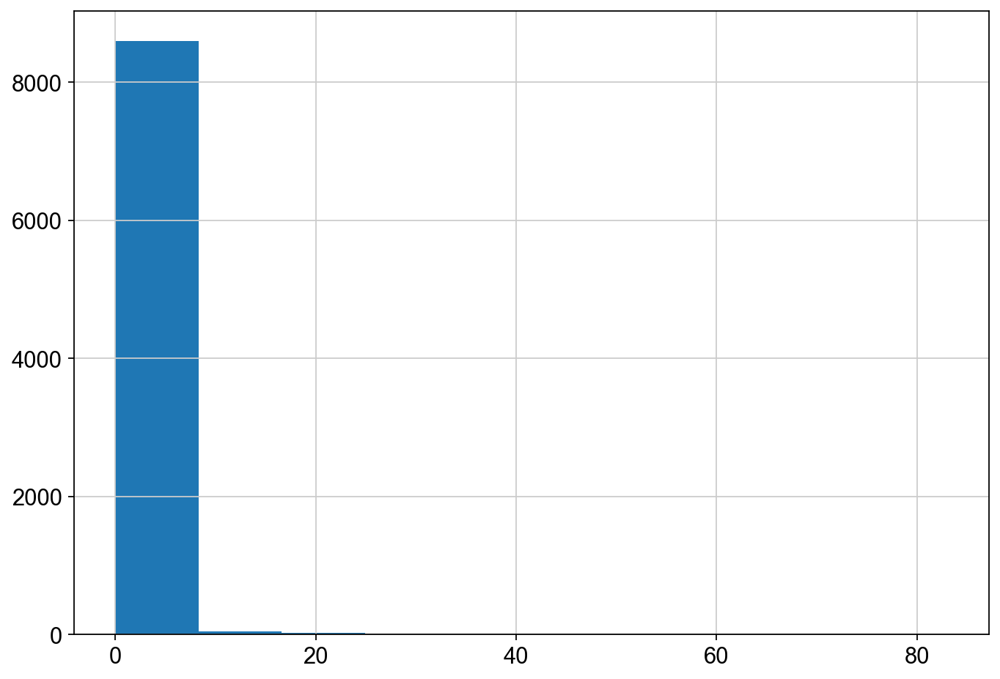

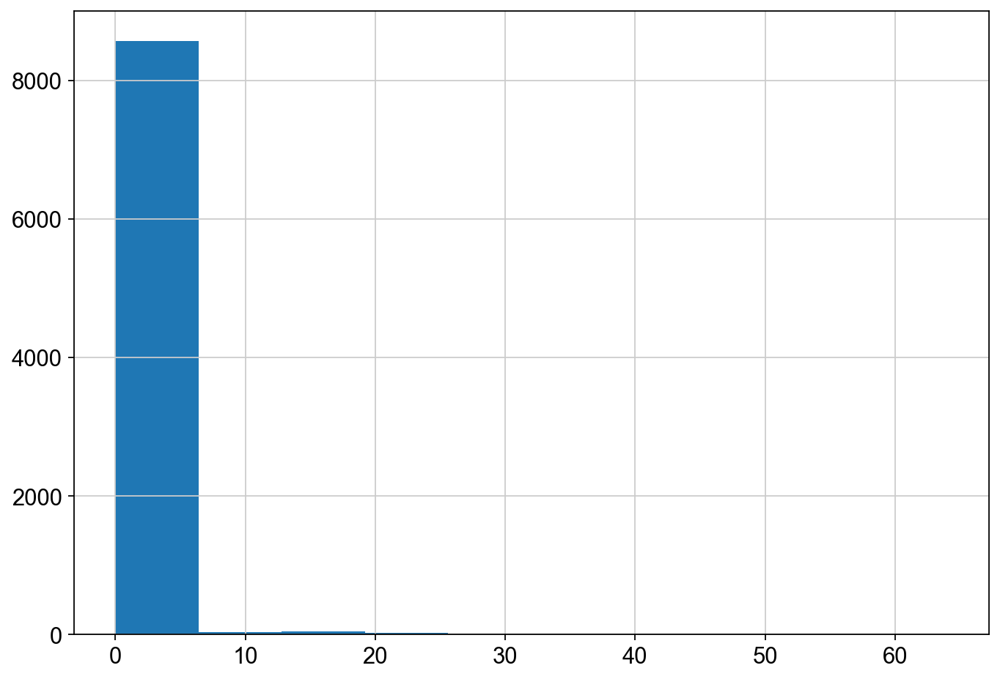

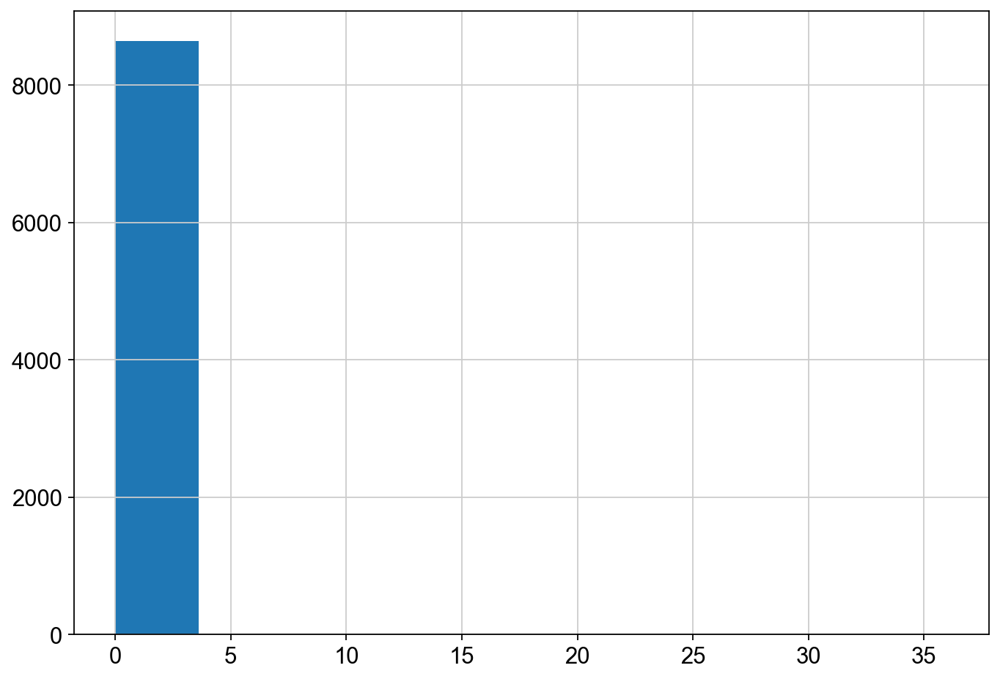

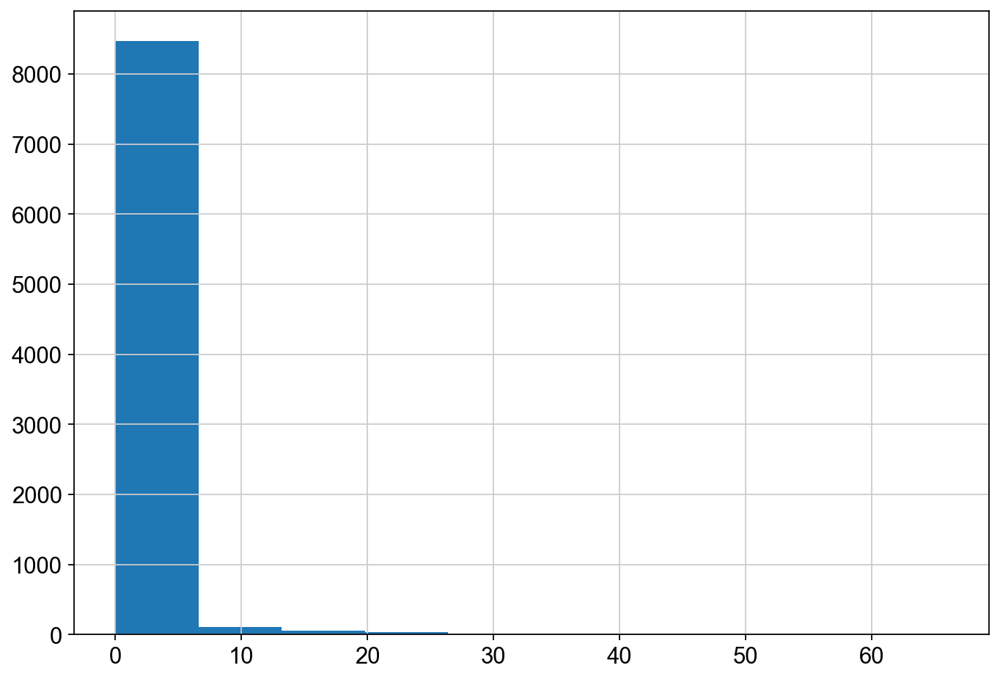

In [36]:
for x in library:
    fig, ax = plt.subplots(figsize =(10, 7))
    ax.hist(adata.X[:,adata.var.index.isin([x])].toarray())
    adata.obs["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()
    hashCounts["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()

In [37]:
hashCounts

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGTCACGAG-1,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCAAGTCTCCTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAACCGATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAATGAACA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACATTCACAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGACGGAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGCAGATACCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
TTTGTTGCATGCGGTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGGTTTCGGCG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


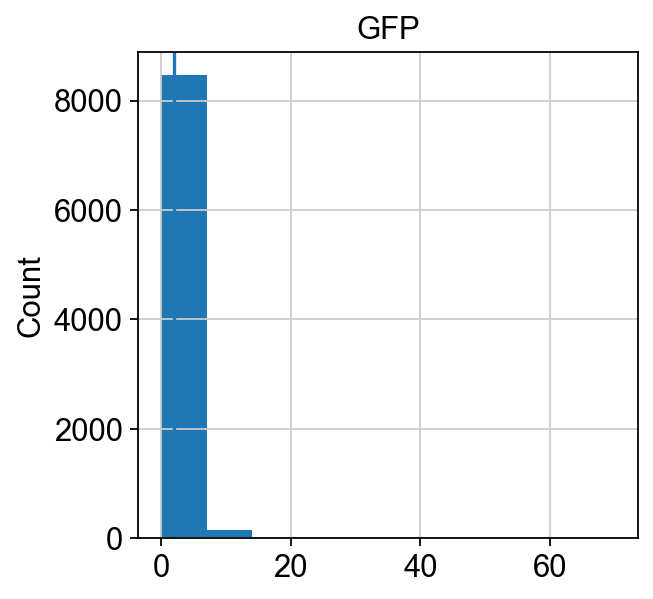

In [38]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'GFP'].X.toarray())
plt.ylabel("Count")
plt.title("GFP")
plt.axvline(x=2)
plt.show()

In [39]:
adata.obs['GFP_count'] = adata.X[:,adata.var.index.isin(['GFP'])].toarray()

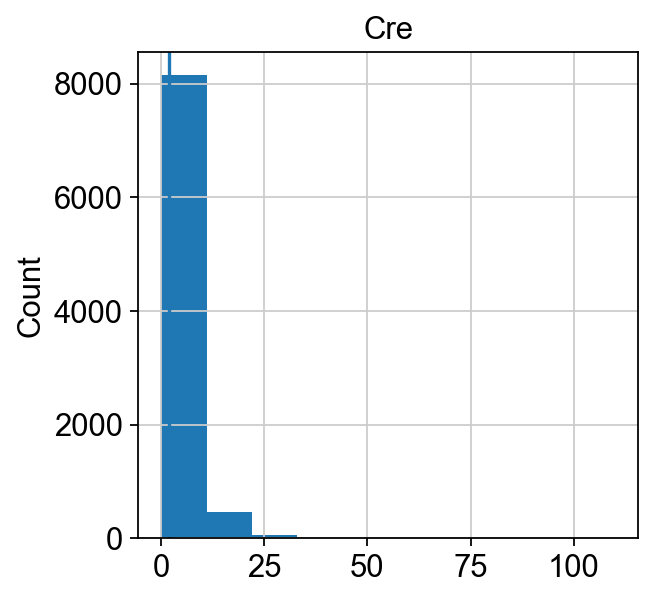

In [40]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'Cre'].X.toarray())
plt.ylabel("Count")
plt.title("Cre")
plt.axvline(x=2)
plt.show()

In [41]:
adata.obs['Cre_count'] = adata.X[:,adata.var.index.isin(['Cre'])].toarray()

## find single library read cells

In [42]:
hashIDs = hashCounts.copy()
for hashName in hashCounts.columns:
    print(hashName)
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
hashIDs

1660-Fosl2.752-library
1661-Fhl2.467-library
1663-Myc.989-library
1665-Yap1.735-library
1667-Atf4.1383-library
1671-Nfkb2.152-library
1673-Relb.286-library
1676-Onecut2.2361-library
1811-Itga2.672-library
1999-Cldn4-951-library
2114-Lif.1890-library
2115-Fosl1.1401-library
2118-Nfkb1.3737-library
shRenilla-library


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ...

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAAGTCACGAG-1,False,True,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCAAGTCTCCTC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACAACCGATT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACAATGAACA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACATTCACAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAGACGGAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGCAGATACCT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,True
TTTGTTGCATGCGGTC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTTTCGGCG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [43]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashCounts.columns[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [44]:
adata.obs["library_id"] = classification
adata.obs["library_id"].value_counts()

library_id
negative                     7253
shRenilla-library             351
1676-Onecut2.2361-library     205
2115-Fosl1.1401-library       173
2114-Lif.1890-library         171
1661-Fhl2.467-library         160
1673-Relb.286-library          70
2118-Nfkb1.3737-library        58
1663-Myc.989-library           57
1665-Yap1.735-library          54
doublet                        45
1660-Fosl2.752-library         40
1671-Nfkb2.152-library         28
1811-Itga2.672-library         16
1667-Atf4.1383-library         13
1999-Cldn4-951-library          5
Name: count, dtype: int64

## Prune filtered cells and run hashing on extra hashtag reads

In [45]:
adata_enriched = sc.read_10x_h5('../barcodes/B/Lib1_B_BC_enriched_filtered_feature_bc_matrix.h5')

reading ../barcodes/B/Lib1_B_BC_enriched_filtered_feature_bc_matrix.h5
 (0:00:00)


In [46]:
# Find the barcodes that exist in BOTH datasets
common_indices = adata_enriched.obs.index.intersection(adata.obs.index)

# Filter the enriched data to only include those common cells and the specific tags
adata_enriched = adata_enriched[common_indices, tags]

In [47]:
hashCounts = pd.DataFrame(adata_enriched.X.todense(), columns=adata_enriched.var_names, index=adata_enriched.obs.index)
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.95,0.99,0.999])
hashCounts

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGTCACGAG-1,96.0,0.0,19.0,21.0,32.0,106.0,12.0,17.0,3.0,6.0,18.0,46.0,3.0,1.0,42.0,33.0,15.0
AAACCCACATTCACAG-1,110.0,0.0,27.0,38.0,28.0,214.0,22.0,24.0,1.0,4.0,15.0,58.0,2.0,0.0,84.0,52.0,22.0
AAACCCATCGACCAAT-1,121.0,1.0,17.0,33.0,33.0,49.0,65.0,16.0,5.0,16.0,20.0,51.0,4.0,2.0,55.0,53.0,16.0
AAACGAACACCACATA-1,51.0,0.0,10.0,10.0,16.0,14.0,14.0,10.0,1.0,8.0,8.0,32.0,1.0,1.0,28.0,22.0,92.0
AAACGAACAGACCTAT-1,122.0,0.0,27.0,25.0,37.0,65.0,29.0,16.0,5.0,7.0,24.0,67.0,2.0,3.0,78.0,179.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCGAATGCT-1,69.0,0.0,12.0,10.0,15.0,26.0,7.0,5.0,1.0,4.0,11.0,27.0,0.0,3.0,19.0,23.0,5.0
TTTGGTTTCTGCGATA-1,73.0,0.0,11.0,12.0,16.0,35.0,10.0,10.0,5.0,7.0,12.0,32.0,2.0,4.0,38.0,25.0,7.0
TTTGTTGAGGCTCCCA-1,90.0,0.0,25.0,24.0,103.0,51.0,23.0,9.0,4.0,9.0,20.0,48.0,1.0,0.0,49.0,49.0,17.0
TTTGTTGCAGACGGAT-1,86.0,0.0,13.0,11.0,11.0,34.0,12.0,13.0,4.0,7.0,8.0,40.0,3.0,3.0,27.0,18.0,8.0


In [48]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
#hashIDs

shRenilla_TGTCTAGT
177.0
shRenilla_CATAGTCA
2.0
shPatch_GTACTTGC
32.0
shPatch_CCATTACT
39.0
1660-Fosl2.752_CGGGAATG
44.0
1661-Fhl2.467_GCCTACGT
80.0
1663-Myc.989_CTGAATCT
26.0
1665-Yap1.735_CGTTAGGG
24.0
1667-Atf4.1383_TCTGGGGC
6.0
1671-Nfkb2.152_CGTTCAAG
15.0
1673-Relb.286_ACAGAGCC
27.0
1676-Onecut2.2361_TTAATTAG
84.0
1811-Itga2.672_GCCAATCG
5.0
1999-Cldn4-951_CGTTTCCT
4.0
2114-Lif.1890_ACACGTGA
90.0
2115-Fosl1.1401_GGTAGGGA
69.69999999999982
2118-Nfkb1.3737_CAGTGCAT
24.0


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in 

In [49]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

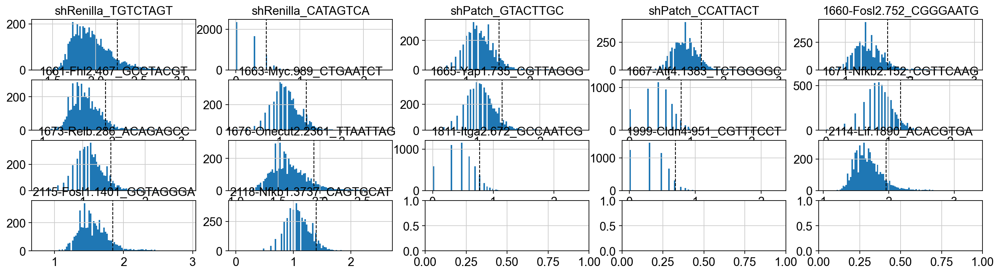

In [50]:
plt.rcParams['figure.figsize'] = (4,4)
fig, axs = plt.subplots(4,5, figsize =(20, 5))

for i, hashName in enumerate(adata_enriched.var_names):
    hashCounts2 = np.log10(hashCounts[hashName]+1)
    axs[i//5,i%5].set_title(hashName)
    axs[i//5,i%5].hist(hashCounts2, bins = 100)
    axs[i//5,i%5].axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)

#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

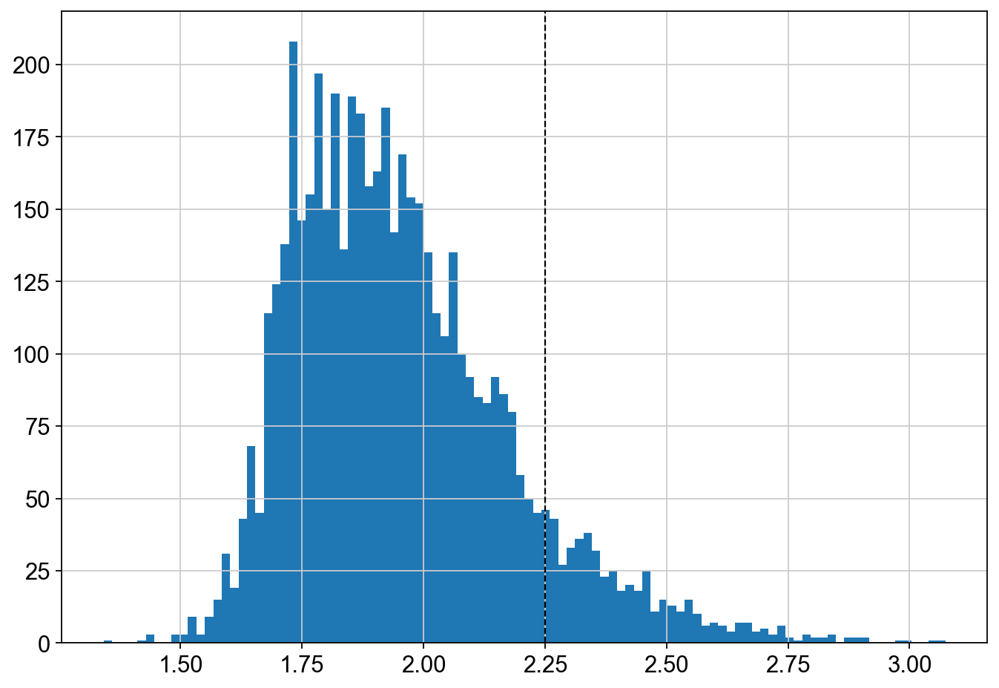

In [51]:
hashName= "shRenilla_TGTCTAGT"
hash301 = np.log10(hashCounts[hashName]+1)

fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(hash301, bins = 100)
ax.axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)
# Show plot
plt.show()

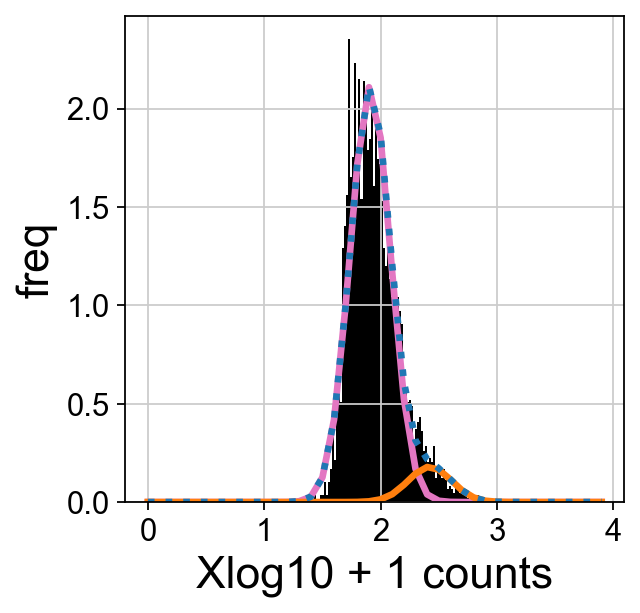

In [52]:
# import libraries (some are for cosmetics)
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

x = np.array(hash301).reshape(-1, 1)

# create GMM model object
gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])

# find useful parameters
fitGMM = gmm.fit(x)
mean = fitGMM.means_  
covs  = fitGMM.covariances_
weights = fitGMM.weights_

# create necessary things to plot
x_axis = np.arange(0, 4, 0.1)
y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

ax = fig.add_subplot(1,2,2)
# Plot 2
plt.hist(x, density=True, color='black', bins=100)
plt.plot(x_axis, y_axis0, lw=3, c='C6')
plt.plot(x_axis, y_axis1, lw=3, c='C1')
plt.plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')
#plt.xlim(0, 4, 0.1)
#plt.ylim(0.0, 2.0)
plt.xlabel(r"Xlog10 + 1 counts", fontsize=20)
plt.ylabel(r"freq", fontsize=20)

#plt.subplots_adjust(wspace=0.3)
plt.show()
plt.close('all')

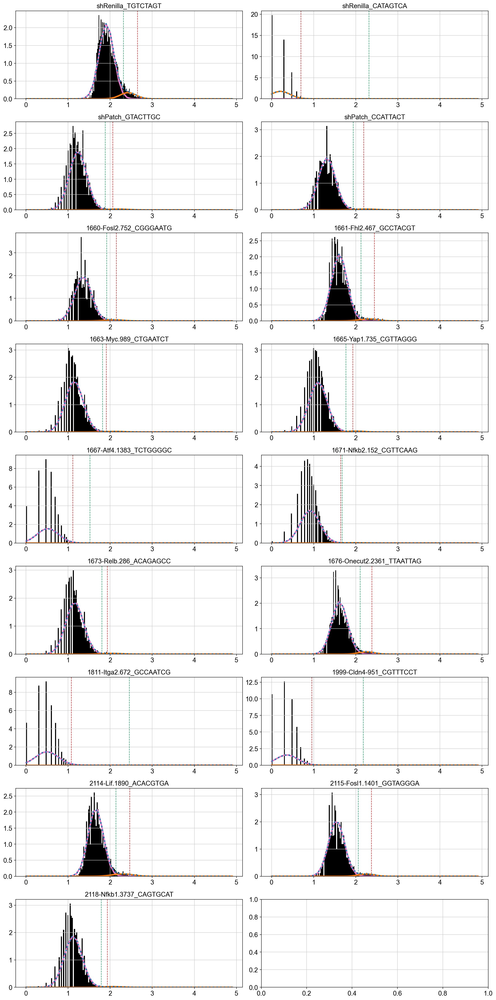

In [53]:
import pdb

fig, axs = plt.subplots(9,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(adata_enriched.var_names)),adata_enriched.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(adata_enriched.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[2],[3]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["95%",hashName])+1)
        else:
            hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            #hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1:# and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
#    hashBoundry = mean[0][0]+1.96*np.sqrt(float(covs[0][0][0]))
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [54]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
shRenilla_TGTCTAGT,2.315
shRenilla_CATAGTCA,2.315
shPatch_GTACTTGC,1.885
shPatch_CCATTACT,1.940
1660-Fosl2.752_CGGGAATG,1.920
1661-Fhl2.467_GCCTACGT,2.125
1663-Myc.989_CTGAATCT,1.820
1665-Yap1.735_CGTTAGGG,1.765
1667-Atf4.1383_TCTGGGGC,1.520
1671-Nfkb2.152_CGTTCAAG,1.675


In [55]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
hashIDs

shRenilla_TGTCTAGT
2.315
shRenilla_CATAGTCA
2.315
shPatch_GTACTTGC
1.885
shPatch_CCATTACT
1.94
1660-Fosl2.752_CGGGAATG
1.92
1661-Fhl2.467_GCCTACGT
2.125
1663-Myc.989_CTGAATCT
1.82
1665-Yap1.735_CGTTAGGG
1.7650000000000001
1667-Atf4.1383_TCTGGGGC
1.52
1671-Nfkb2.152_CGTTCAAG
1.675
1673-Relb.286_ACAGAGCC
1.805
1676-Onecut2.2361_TTAATTAG
2.105
1811-Itga2.672_GCCAATCG
2.455
1999-Cldn4-951_CGTTTCCT
2.18
2114-Lif.1890_ACACGTGA
2.14
2115-Fosl1.1401_GGTAGGGA
2.06
2118-Nfkb1.3737_CAGTGCAT
1.79


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/68405080.py:6: FutureWarning: Setting an item of incompatible

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAAGTCACGAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCACATTCACAG-1,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCGACCAAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACGAACACCACATA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True
AAACGAACAGACCTAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCGAATGCT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGGTTTCTGCGATA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGAGGCTCCCA-1,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGCAGACGGAT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [56]:
classification = np.empty(len(adata_enriched), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [57]:
adata_enriched.obs['Library'] = classification
adata.obs["Library"] = adata_enriched.obs['Library']
adata.obs["Library"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2727749959.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_enriched.obs['Library'] = classification


Library
negative                      3869
shRenilla_TGTCTAGT             244
doublet                        155
2115-Fosl1.1401_GGTAGGGA       117
1676-Onecut2.2361_TTAATTAG     115
2114-Lif.1890_ACACGTGA         106
1661-Fhl2.467_GCCTACGT          88
1660-Fosl2.752_CGGGAATG         76
shPatch_CCATTACT                56
1665-Yap1.735_CGTTAGGG          53
2118-Nfkb1.3737_CAGTGCAT        48
shPatch_GTACTTGC                48
1673-Relb.286_ACAGAGCC          46
1663-Myc.989_CTGAATCT           37
1671-Nfkb2.152_CGTTCAAG         30
1667-Atf4.1383_TCTGGGGC         12
1999-Cldn4-951_CGTTTCCT          2
1811-Itga2.672_GCCAATCG          1
shRenilla_CATAGTCA               1
Name: count, dtype: int64

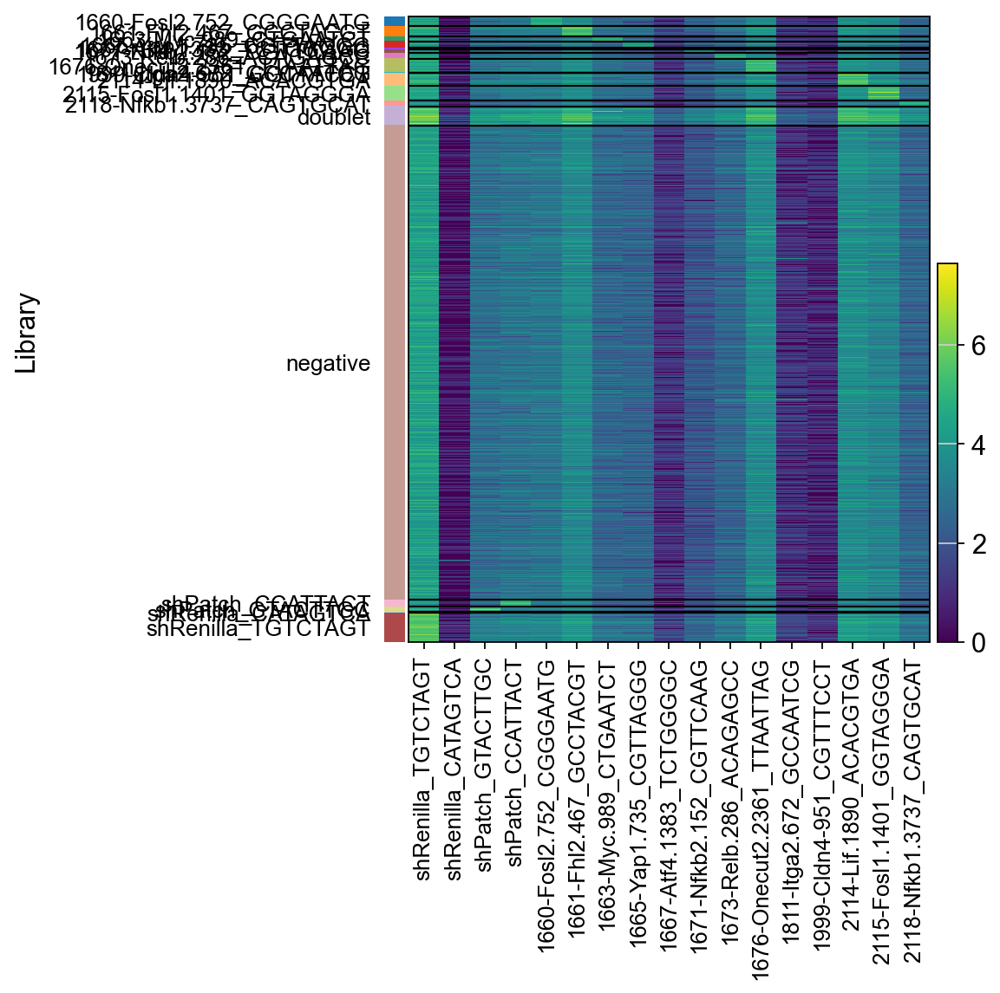

In [58]:
#output visulaization of hashing
sc.pl.heatmap(adata_enriched, adata_enriched.var_names, groupby="Library", log=True)#, save = f"_{figName}_hash.png")

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

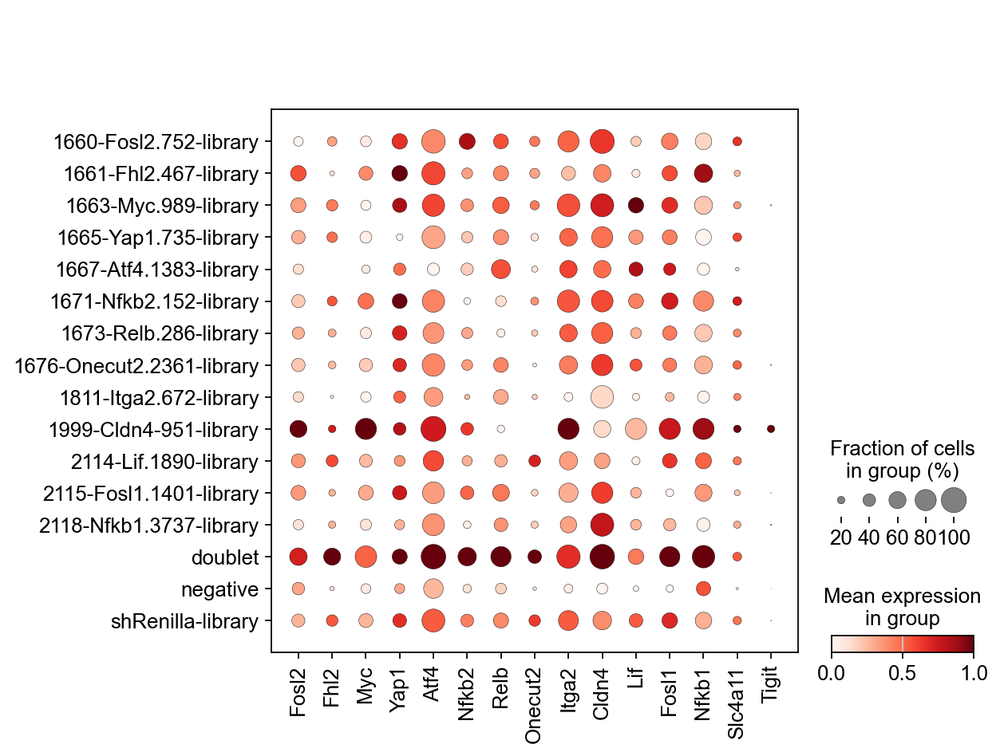

In [59]:
sc.pl.dotplot(adata, targetGenes, groupby='library_id', standard_scale='var')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

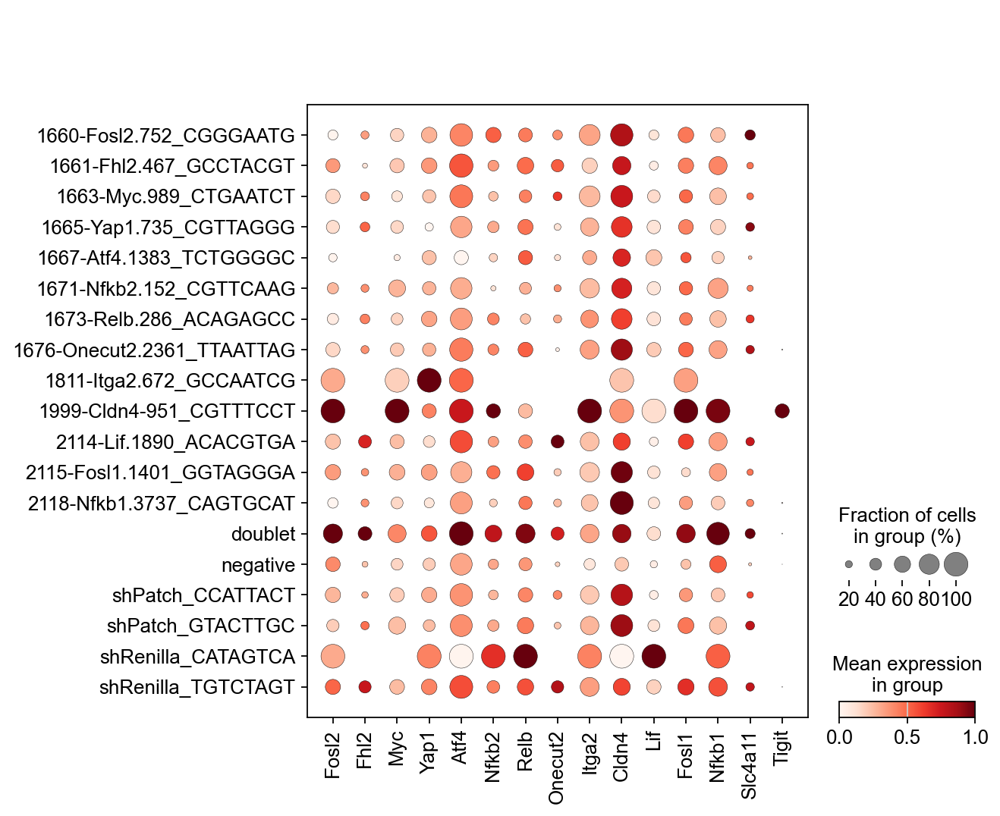

In [60]:
sc.pl.dotplot(adata, targetGenes, groupby='Library', standard_scale='var')

In [61]:
adata.obs.Library.value_counts()

Library
negative                      3869
shRenilla_TGTCTAGT             244
doublet                        155
2115-Fosl1.1401_GGTAGGGA       117
1676-Onecut2.2361_TTAATTAG     115
2114-Lif.1890_ACACGTGA         106
1661-Fhl2.467_GCCTACGT          88
1660-Fosl2.752_CGGGAATG         76
shPatch_CCATTACT                56
1665-Yap1.735_CGTTAGGG          53
shPatch_GTACTTGC                48
2118-Nfkb1.3737_CAGTGCAT        48
1673-Relb.286_ACAGAGCC          46
1663-Myc.989_CTGAATCT           37
1671-Nfkb2.152_CGTTCAAG         30
1667-Atf4.1383_TCTGGGGC         12
1999-Cldn4-951_CGTTTCCT          2
1811-Itga2.672_GCCAATCG          1
shRenilla_CATAGTCA               1
Name: count, dtype: int64

In [62]:
adata.obs.library_id.value_counts()

library_id
negative                     7253
shRenilla-library             351
1676-Onecut2.2361-library     205
2115-Fosl1.1401-library       173
2114-Lif.1890-library         171
1661-Fhl2.467-library         160
1673-Relb.286-library          70
2118-Nfkb1.3737-library        58
1663-Myc.989-library           57
1665-Yap1.735-library          54
doublet                        45
1660-Fosl2.752-library         40
1671-Nfkb2.152-library         28
1811-Itga2.672-library         16
1667-Atf4.1383-library         13
1999-Cldn4-951-library          5
Name: count, dtype: int64

In [63]:
import re
m = re.compile("(.+\-|negative|doublet)")

In [64]:
i=0
for x, y in adata.obs[['library_id', 'Library']].iterrows():
    print(y)
    i+=1
    if i == 1: 
        library_id,Library = y
        print(library_id[:-8])
        break

library_id    1661-Fhl2.467-library
Library                    negative
Name: AAACCCAAGTCACGAG-1, dtype: object
1661-Fhl2.467


In [65]:
classification = np.empty(len(adata), dtype="object")
i=0
import re
m1 = re.compile("(.+\-library|negative|doublet)")
m2 = re.compile("(.+\_)|negative|doublet")
for x,y in adata.obs[['library_id', 'Library']].iterrows():
    library_id,Library = y
    m1match = m1.match(library_id)
    if pd.isna(Library): 
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        classification[i] = m1match
    elif m1.match(library_id) and m2.match(Library):
        m2match = m2.match(Library)
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        if m2match.group(0)[-1] == "_":
            m2match = m2match.group(0)[:-1]
        else:
            m2match = m2match.group(0)
        if m1match == m2match:
            classification[i] = m1match
        elif m1match == 'doublet' or m2match == 'doublet':
            classification[i] = 'doublet'
        elif m1match == 'negative':
            classification[i] = m2match
        elif m2match == 'negative':
            classification[i] = m1match
        else:
            classification[i] = 'mismatch'
    i += 1
adata.obs['cLibrary'] = classification

In [66]:
adata.obs.cLibrary.value_counts()

cLibrary
negative             6903
shRenilla             401
1676-Onecut2.2361     205
2115-Fosl1.1401       176
2114-Lif.1890         172
doublet               162
1661-Fhl2.467         151
shPatch               102
1660-Fosl2.752         90
1673-Relb.286          78
1665-Yap1.735          66
1663-Myc.989           58
2118-Nfkb1.3737        57
1671-Nfkb2.152         33
1667-Atf4.1383         17
1811-Itga2.672         16
mismatch                8
1999-Cldn4-951          4
Name: count, dtype: int64

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

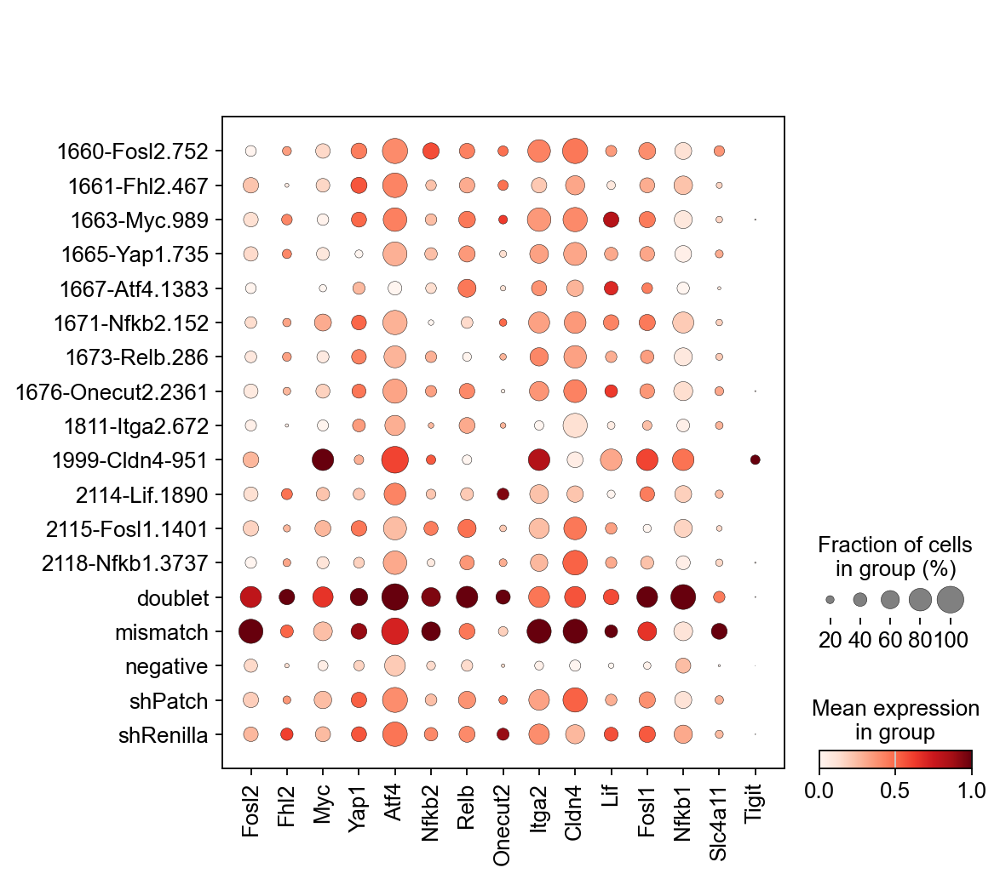

In [67]:
sc.pl.dotplot(adata, targetGenes, groupby='cLibrary', standard_scale='var')

## Set highly variable genes

In [68]:
adata = adata[~(adata.obs['Classification'].isin(['doublet','negative'])|adata.obs['library_id'].isin(['doublet'])),:]

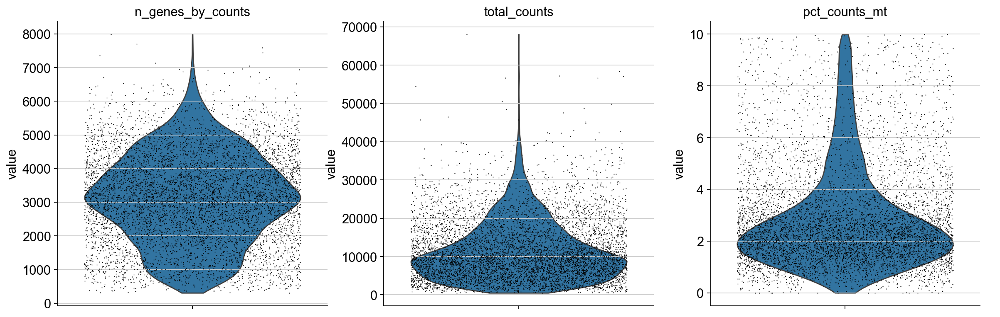

In [69]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

In [70]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data:

In [71]:
sc.pp.log1p(adata)

In [72]:
sc.pp.highly_variable_genes(adata) #batch_key=Classification

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


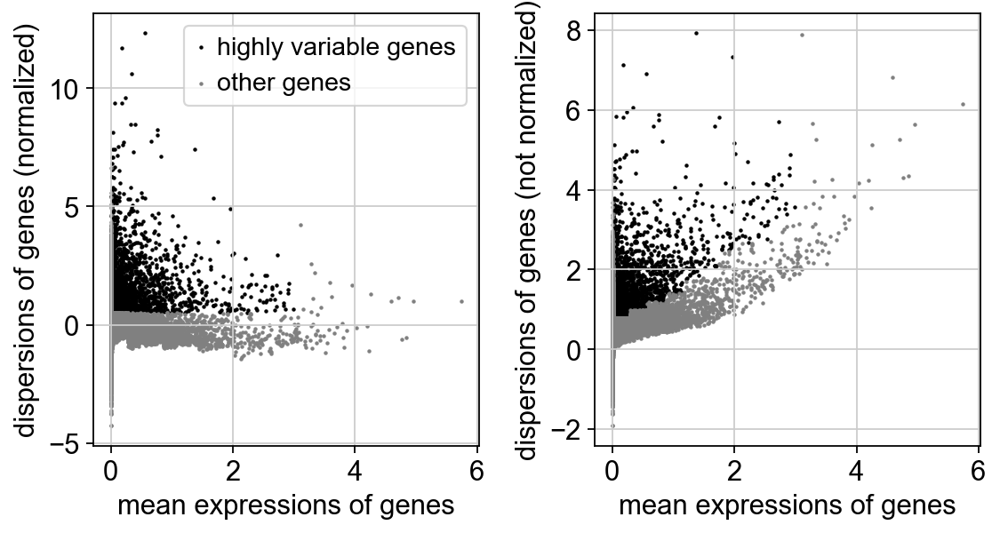

In [73]:
sc.pl.highly_variable_genes(adata)

In [74]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2494002

In [75]:
adata.obs['library_id'].value_counts()

library_id
negative                     5483
shRenilla-library             286
1676-Onecut2.2361-library     176
2115-Fosl1.1401-library       145
2114-Lif.1890-library         119
1661-Fhl2.467-library         110
1673-Relb.286-library          57
2118-Nfkb1.3737-library        52
1663-Myc.989-library           45
1665-Yap1.735-library          45
1660-Fosl2.752-library         37
1671-Nfkb2.152-library         25
1811-Itga2.672-library         16
1667-Atf4.1383-library         12
1999-Cldn4-951-library          3
Name: count, dtype: int64

In [76]:
#Set shRNA groups
adata.obs['shRNA'] = None
for x in adata.obs["library_id"].cat.categories:
    if x == 'negative':continue
    adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2310838860.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x
/var/folders/xc/wjwqs2j55dqgp2ghrn6n

In [77]:
adata.obs[['Classification','shRNA']].value_counts()

Classification  shRNA                    
AO1092_B0306    shRenilla-library            102
AM1063_B0305    1661-Fhl2.467-library         91
                shRenilla-library             75
                2115-Fosl1.1401-library       75
AO1092_B0306    1676-Onecut2.2361-library     55
                                            ... 
AN1062_B0304    1999-Cldn4-951-library         1
AO1376_B0302    1661-Fhl2.467-library          1
AN1062_B0304    1667-Atf4.1383-library         1
AM1815_B0301    2118-Nfkb1.3737-library        1
                1667-Atf4.1383-library         1
Name: count, Length: 72, dtype: int64

In [78]:
sum(adata.obs[['Classification','shRNA']].value_counts())

1128

In [79]:
adata.raw = adata

In [80]:
adata.write('write/allmice-noSCT.h5ad', compression='gzip')

In [81]:
adata = adata[:, adata.var.highly_variable]

In [82]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:19)


In [83]:
sc.pp.scale(adata, max_value=10)

## Principal component analysis

In [84]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:01)


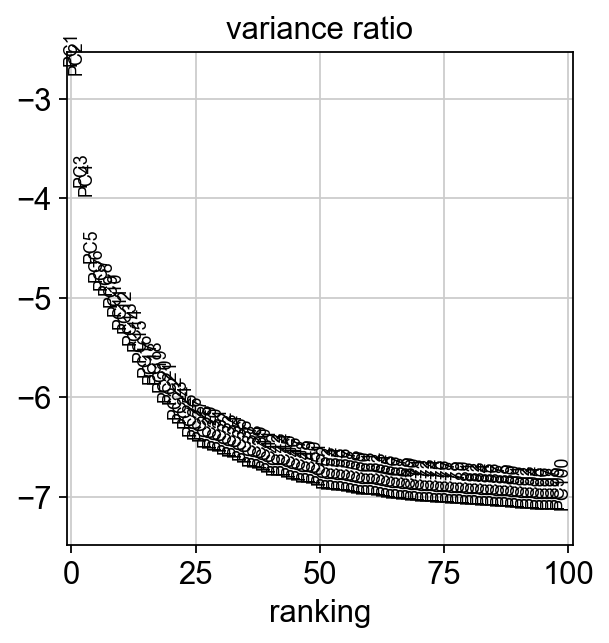

In [85]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

Save the result.

In [86]:
adata.write(results_file, compression='gzip')

In [87]:
adata

AnnData object with n_obs × n_vars = 6611 × 3177
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [88]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


## Embedding the neighborhood graph

In [89]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


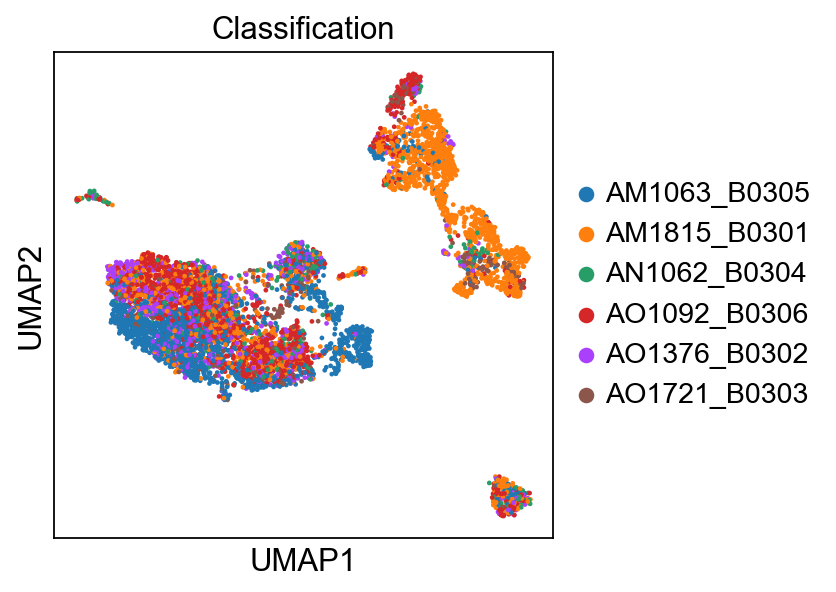

In [90]:
sc.pl.umap(adata, color=['Classification'])

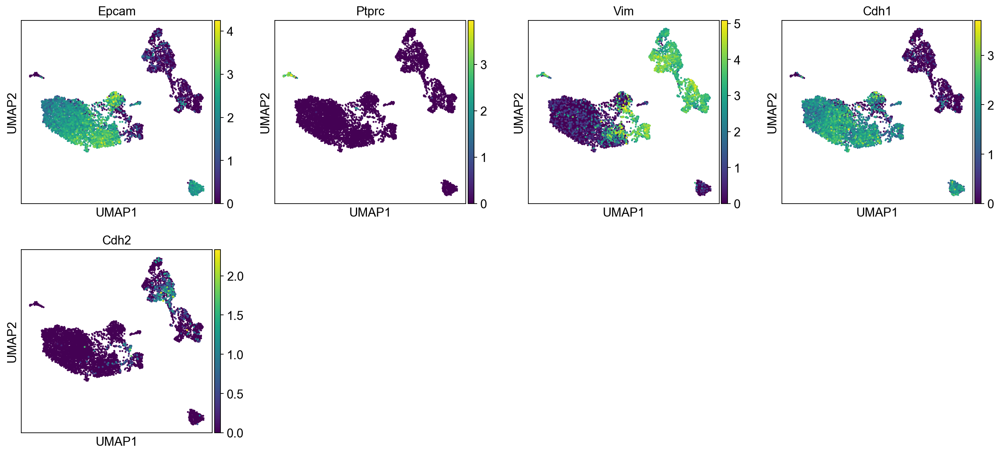

In [91]:
sc.pl.umap(adata, color=['Epcam', 'Ptprc','Vim', 'Cdh1','Cdh2'])

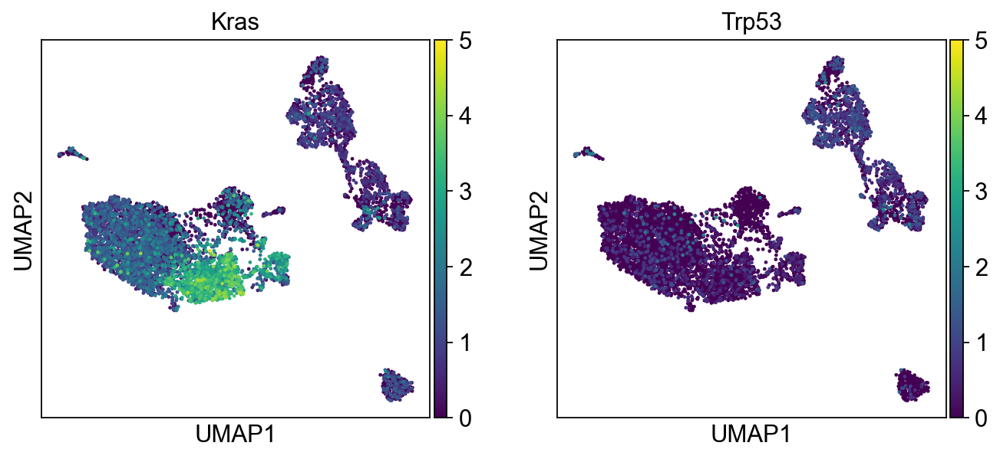

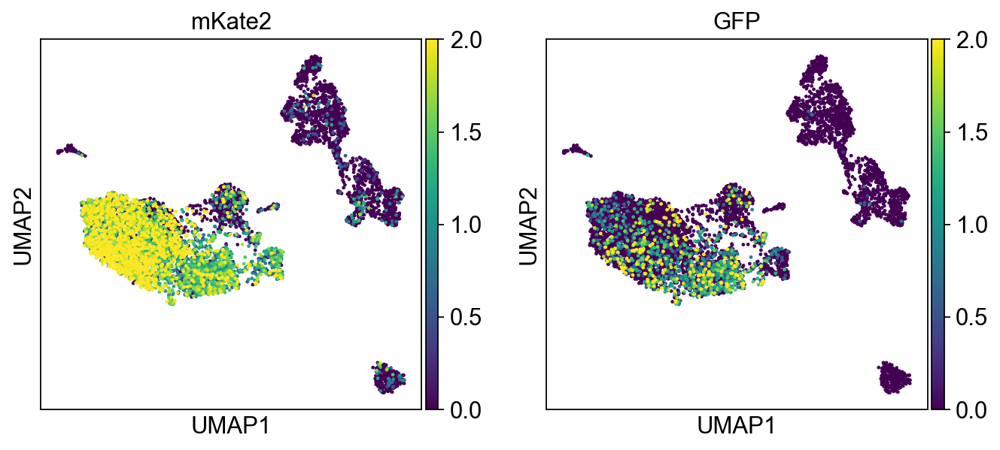

In [92]:
sc.pl.umap(adata, color=['Kras','Trp53'], vmax=5)
sc.pl.umap(adata, color=['mKate2','GFP'], vmax=2)

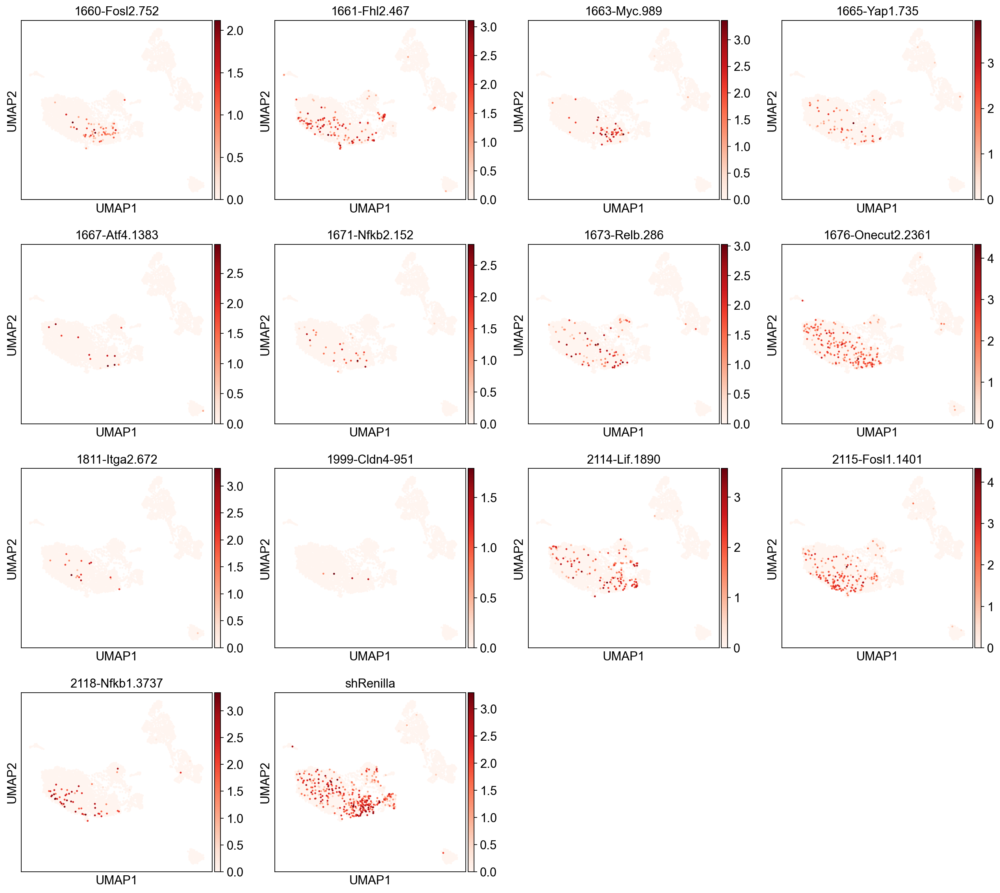

In [93]:
sc.pl.umap(adata, color=library, cmap='Reds')

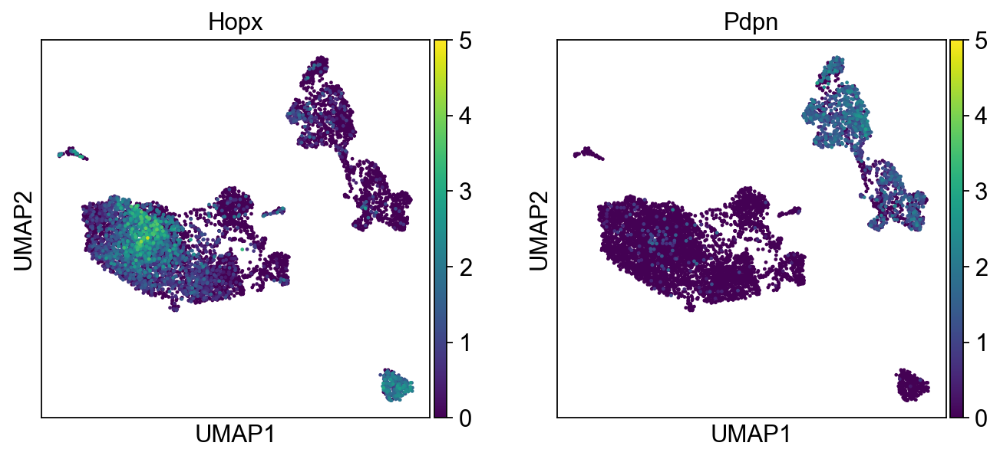

In [94]:
sc.pl.umap(adata, color=['Hopx','Pdpn'], vmax=5)

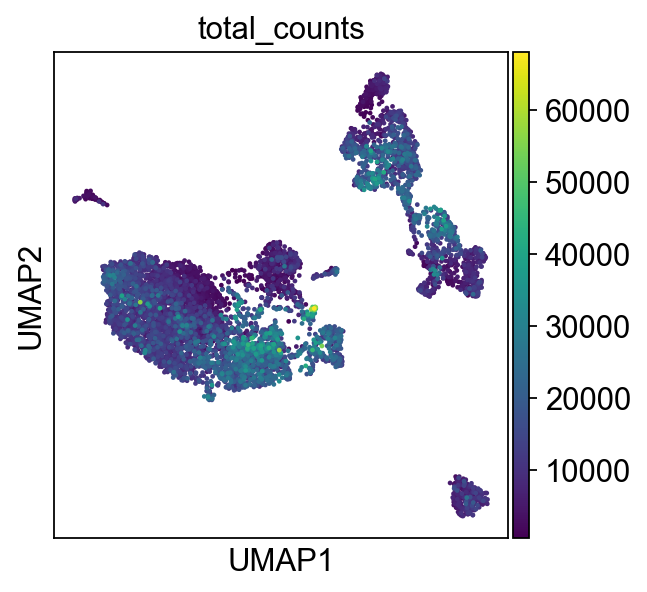

In [95]:
sc.pl.umap(adata, color=['total_counts'])

## Clustering the neighborhood graph

In [96]:
#sc.tl.leiden(adata, resolution=0.30)
sc.tl.leiden(adata, resolution=0.35)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


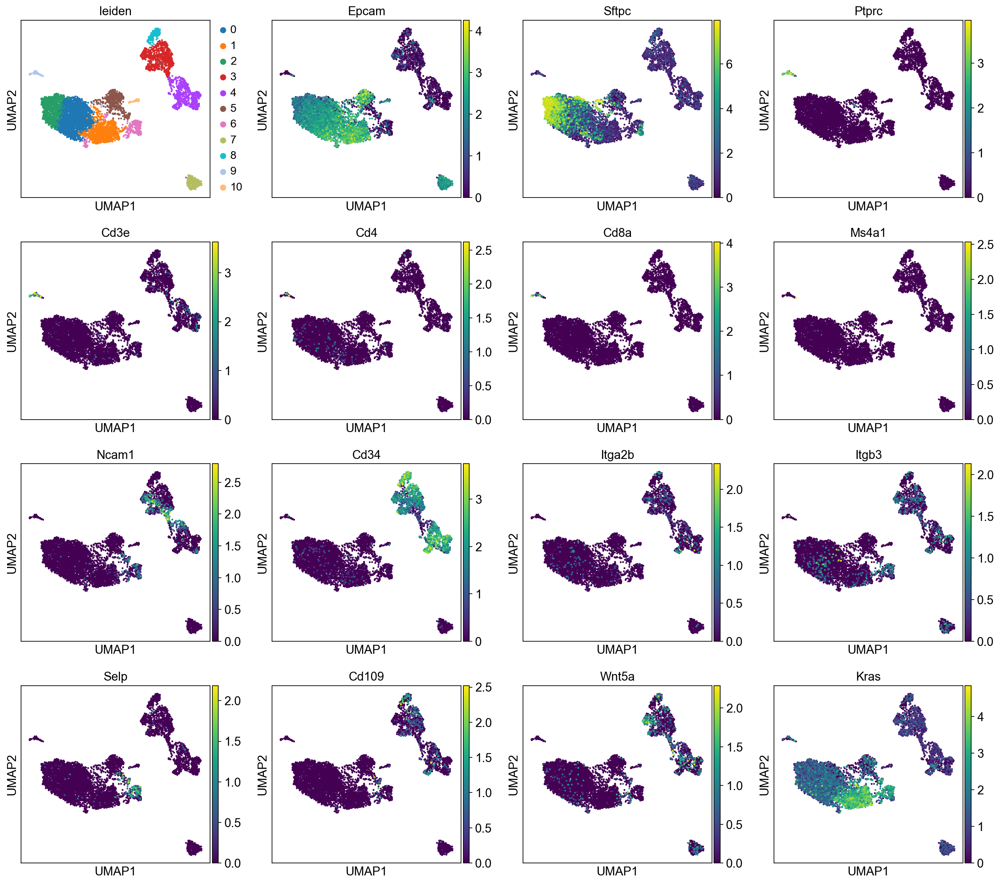

In [97]:
sc.pl.umap(adata, color=['leiden', 'Epcam', 'Sftpc', # Tumor cells
                         'Ptprc', #immune
                         'Cd3e', 'Cd4', 'Cd8a', #T cell
                          'Ms4a1', #'Cd22', # B cell 'Cd19',
                         #'Itgax', 'Il3ra', # Dendritic Cell
                         'Ncam1',# 'Ncr1', # NK Cell
                         'Cd34', # Hematopoetic stem cell
                         #'Cd14', 'Cd33', # macrophage
                         #'Ceacam8' # Granulocyte
                         'Itga2b', 'Itgb3', 'Selp', #platelet
                         #'Gypa',  # erythrocyte
                         #'Mcam', 'Vcam1', 'Pecam1', 'Sele', # endothelial cell
                         'Cd109', 'Wnt5a', 'Kras'])

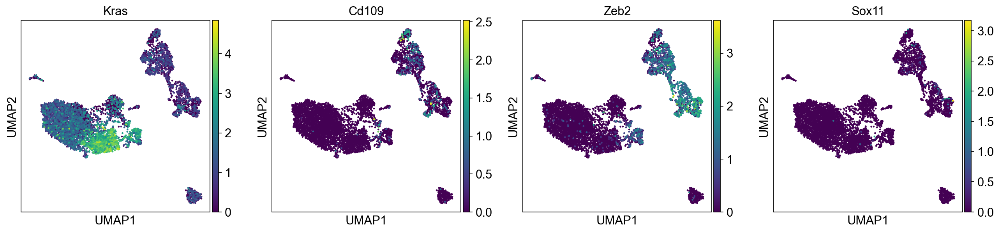

In [98]:
sc.pl.umap(adata, color=['Kras', 'Cd109', 'Zeb2', 'Sox11'])

Save the result.

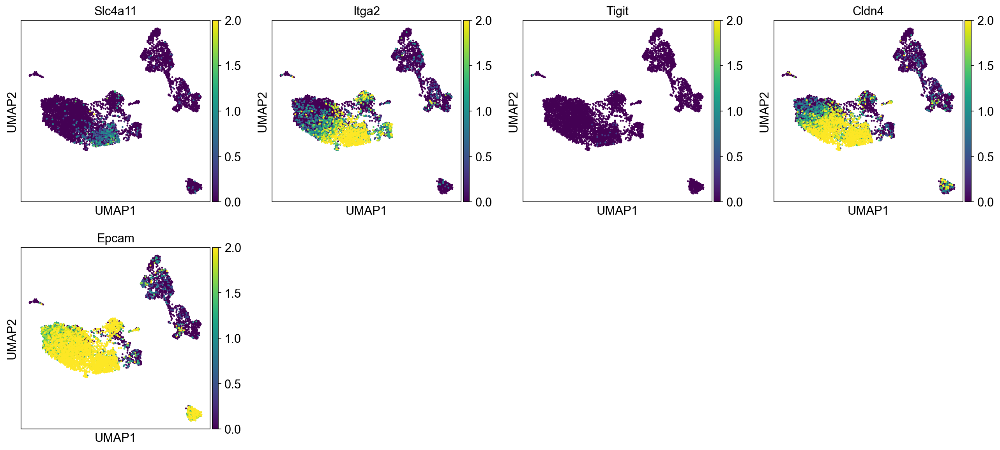

In [99]:
sc.pl.umap(adata, color=['Slc4a11', 'Itga2', 'Tigit', 'Cldn4','Epcam'], vmax=2)

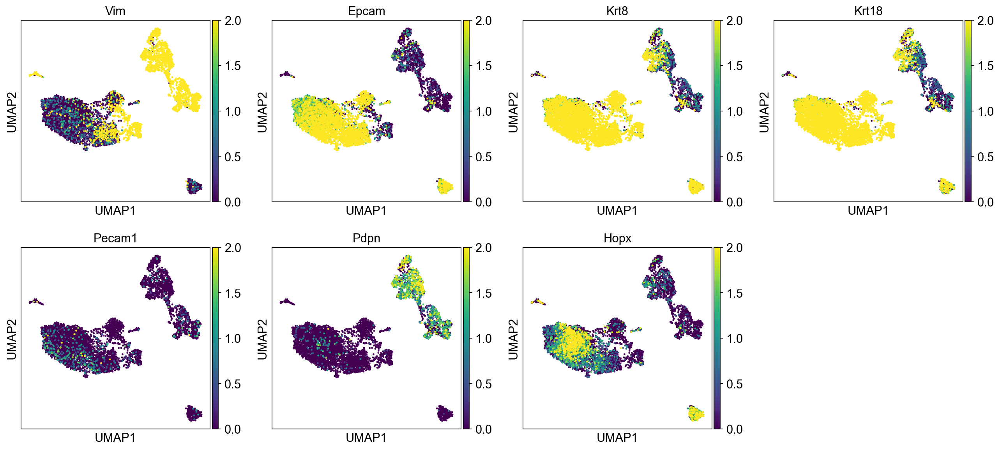

In [100]:
sc.pl.umap(adata, color=['Vim', 'Epcam', 'Krt8', 'Krt18','Pecam1', 'Pdpn', 'Hopx'], vmax=2)

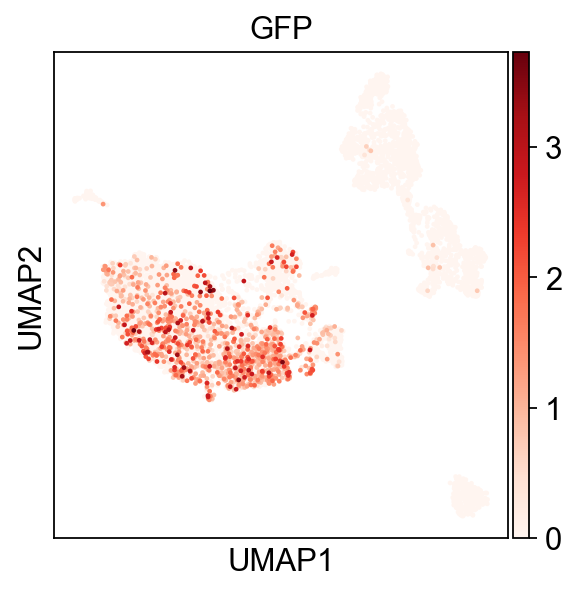

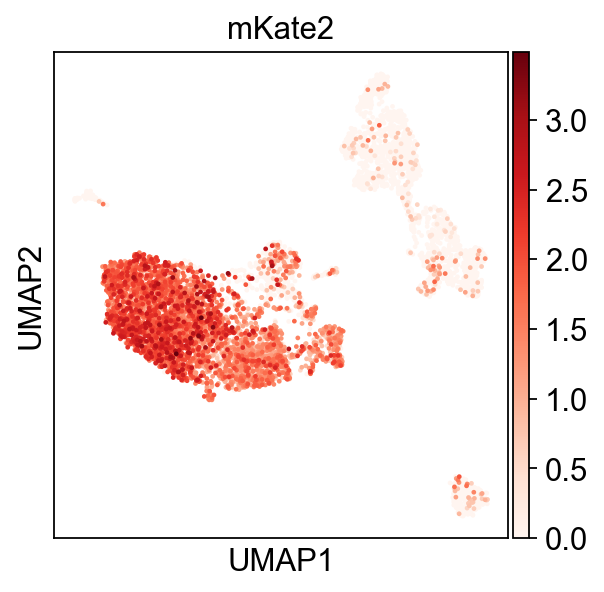

In [101]:
sc.pl.umap(adata, color=['GFP'], cmap='Reds')
sc.pl.umap(adata, color=['mKate2'], cmap='Reds')

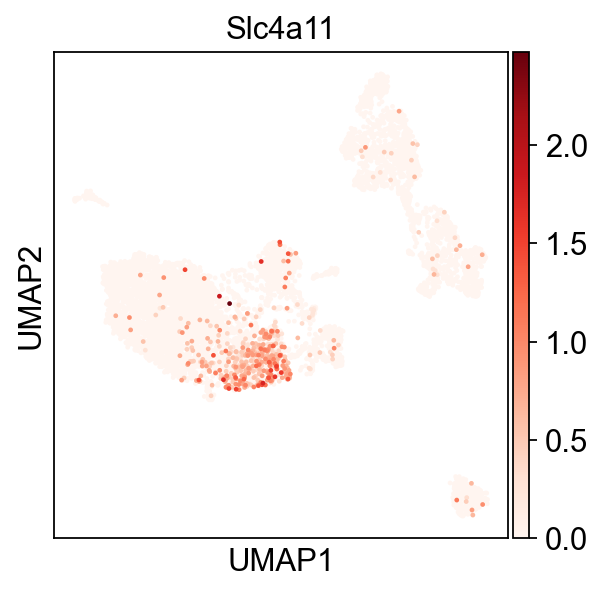

In [102]:
sc.pl.umap(adata, color=['Slc4a11'], cmap='Reds')

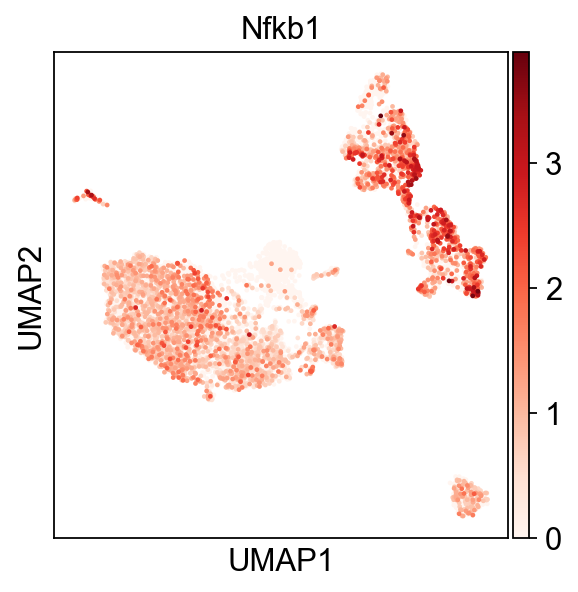

In [103]:
sc.pl.umap(adata, color=['Nfkb1'], cmap='Reds')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


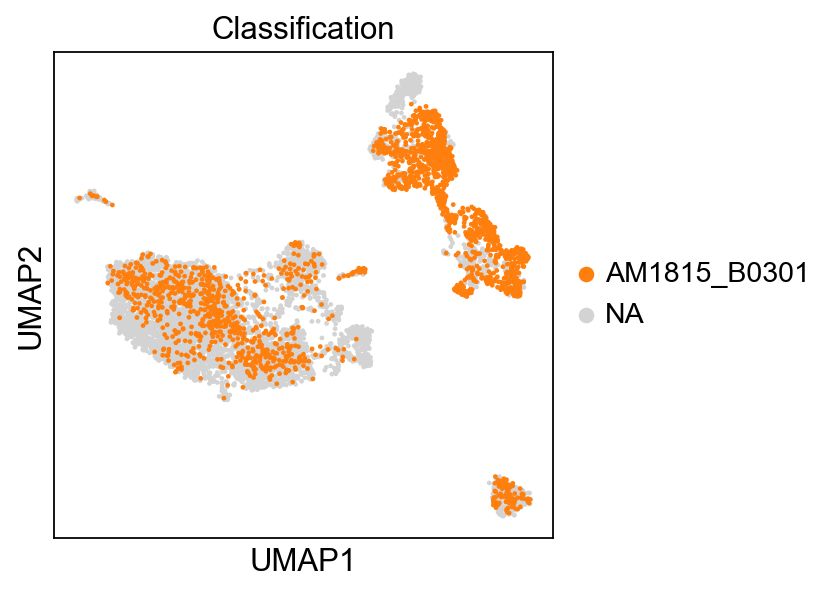

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


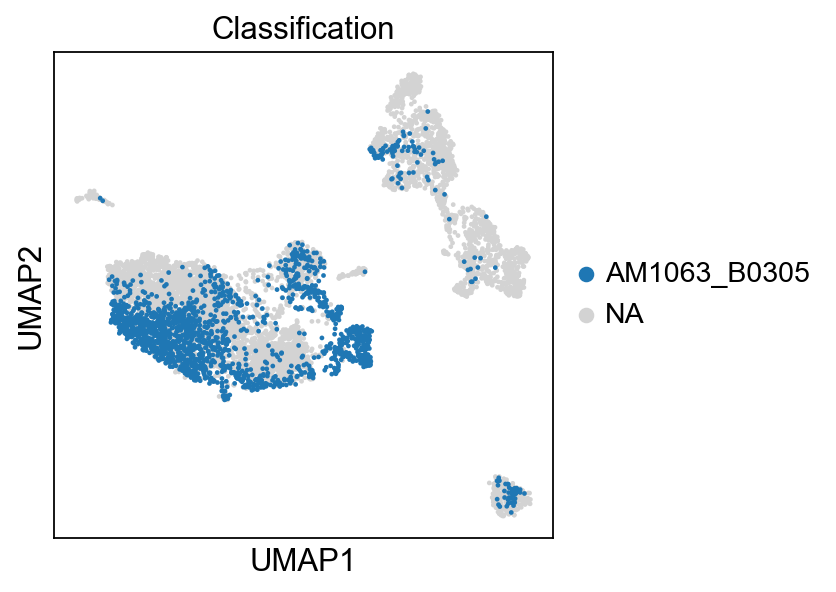

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


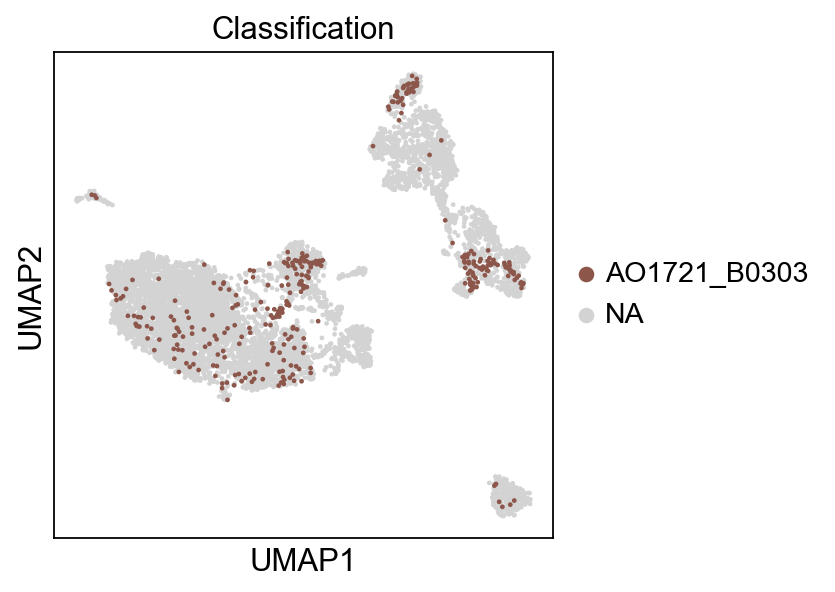

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


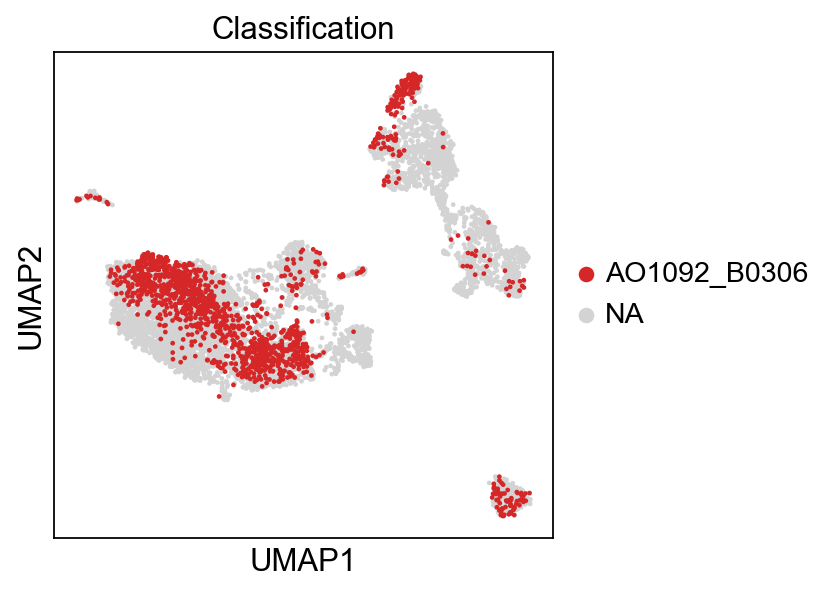

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


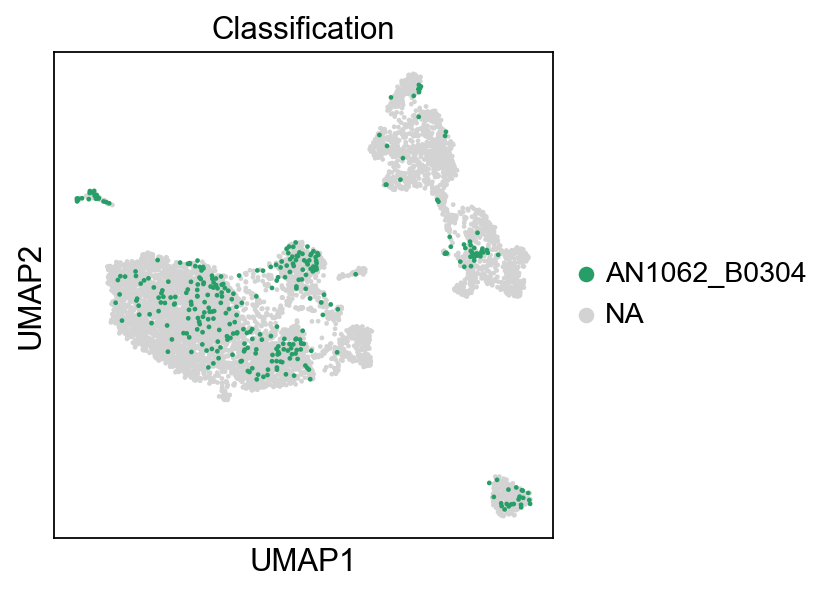

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


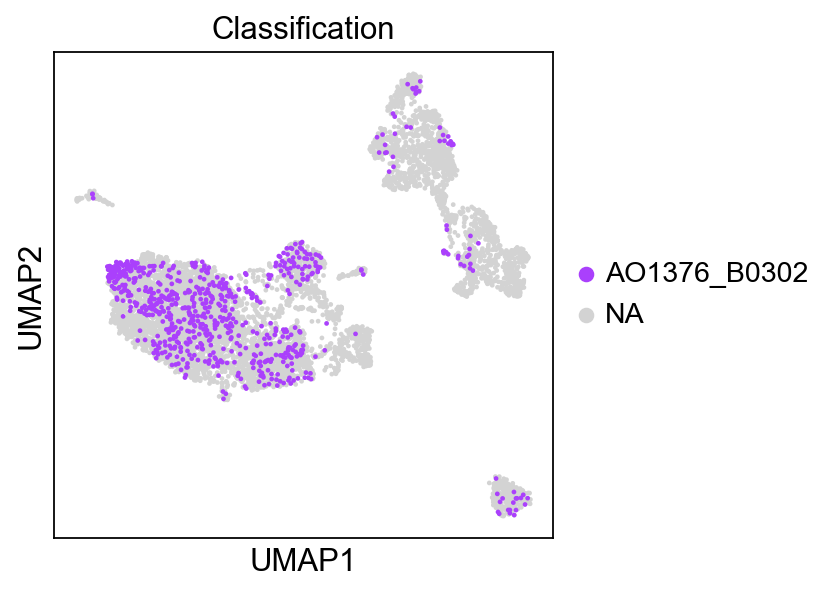

In [104]:
for label in adata.obs['Classification'].unique():
    sc.pl.umap(adata, color='Classification',groups=[label])

In [105]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

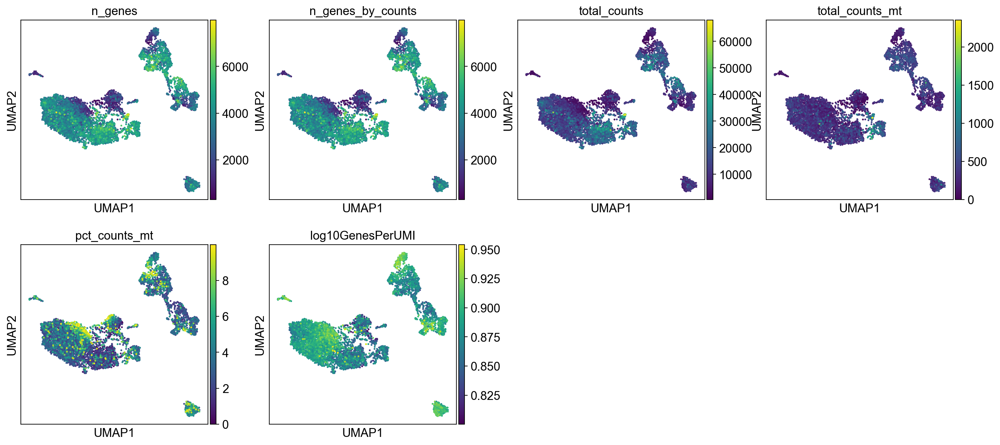

In [106]:
sc.pl.umap(adata,color=['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI'])

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


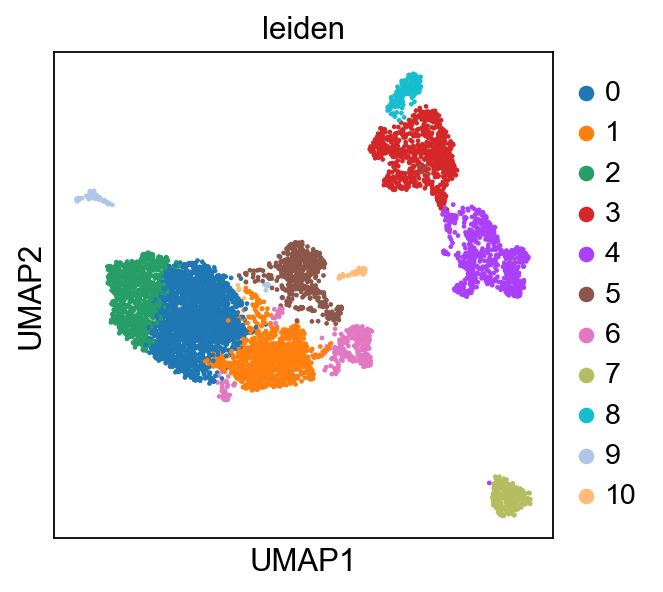

In [107]:
sc.pl.umap(adata,color='leiden')

In [108]:
adata

AnnData object with n_obs × n_vars = 6611 × 3177
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'dis

In [109]:
adata[adata.obs.leiden.isin(['0','1','2','5','6','10']),:]

View of AnnData object with n_obs × n_vars = 4717 × 3177
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    ob

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


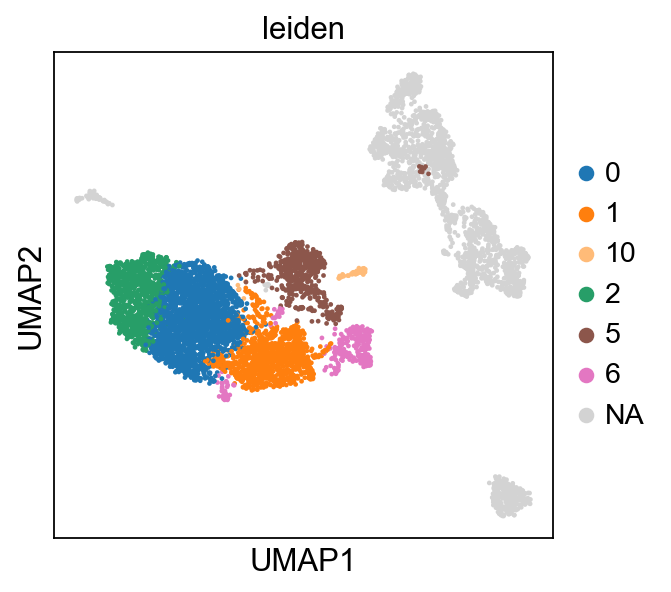

In [110]:
sc.pl.umap(adata, color=['leiden'], groups=['0','1','2','5','6','10']) # cluster 3 seems to be fibroblasts

## Save Tumor Cells

In [111]:
# Select only those subset of cells that are useful
adata2 = sc.read('write/allmice-noSCT.h5ad')
adata = adata2[adata.obs['leiden'].isin(['0','1','2','5','6','10']),:] # remove fibroblast cells
del adata2

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [112]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

In [113]:
sc.pp.highly_variable_genes(adata)#, batch_key='Classification')

extracting highly variable genes
    finished (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [114]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_32269/2494002

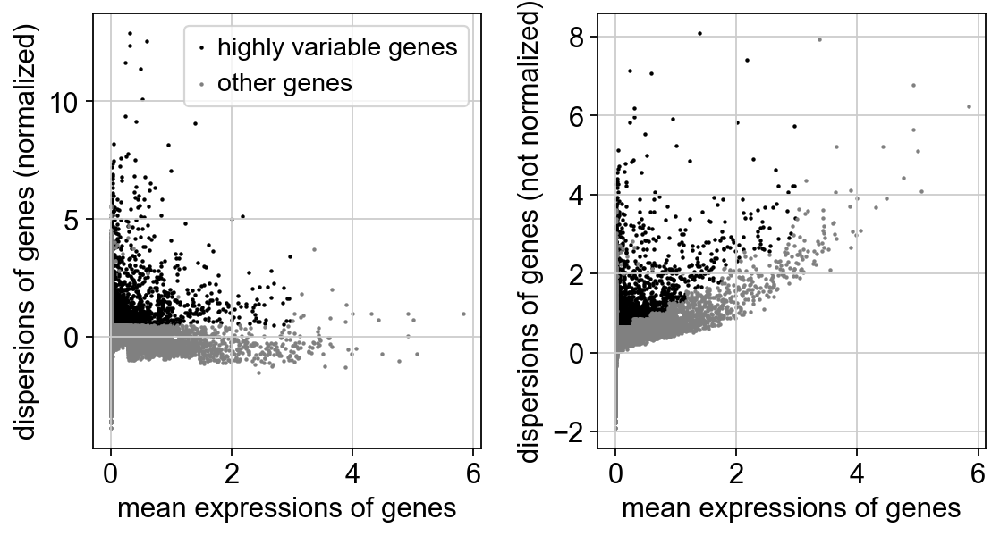

In [115]:
sc.pl.highly_variable_genes(adata)

In [116]:
adata.raw = adata

In [117]:
adata.write('write/allmice-tumornoSCT.h5ad', compression='gzip')
#adata = sc.read('write/allmice-tumornoSCT.h5ad')